___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Tree Types Prediction Project***". This is the second medium project of ***Machine Learning*** course.

In this project, you must apply ***EDA*** processes for the development of predictive models. Handling outliers, domain knowledge and feature engineering (using ***sqlite3*** library) will be challenges. 

Also, this project aims to improve your ability to implement algorithms for ***Multi-Class Classification***. Thus, you will have the opportunity to implement many algorithms commonly used for Multi-Class Classification problems.

Before diving into the project, please take a look at the determines and tasks.

- ***NOTE:*** *This project assumes that you already know the basics of coding in Python. You should also be familiar with the theory behind classification models and scikit-learn module as well as Machine Learning before you begin.*

---
---

# #Determines

Dataset contains tree observations from four areas of one national forest district. This dataset includes information on tree type, shadow coverage, distance to nearby landmarks, soil type, and local topography. The goal of the project is to build a model that predicts what types of trees grow in an area.
***The Forest Dataset*** contains approximately 600 thousand lines, also you can easily find many information about it on the web (especially Kaggle).

---

To achieve high prediction success, you must understand the data well and develop different approaches that can affect the dependent variable.

Firstly, try to understand the dataset column by column using pandas module. Do research within the scope of domain (forest, trees) knowledge on the internet to get to know the data set in the fastest way. 

You should implement cleaning, handling with outliers and missing values using Pandas, NumPy and other required modules for the best result in modeling. You should do Feature Engineering using SQLite local database. 

At this point, in order to improve your skills of using SQL with Python, you are asked to perform feature engineering operations using *sqlite3* library in Python.

After that, your final dataset with the new variables you have created will be ready for model building. You will implement ***Support Vector Machine, XGBoost, Random Forest, Desicion Tree*** and ***K-Nearest Neighbors (KNN)*** algorithms. Also, evaluate the success of your models with appropriate performance metrics and visualize them using ***Yellowbrick, Seaborn*** or ***Matplotlib*** modules.

At the end of the project, create a chart comparing the performance of all models and choose the most successful model.

- ***NOTE:*** *Evaluate your models knowing that this is [imbalanced data](https://towardsdatascience.com/having-an-imbalanced-dataset-here-is-how-you-can-solve-it-1640568947eb). This is not the primary goal of the project, but you can study solve the class [imbalance problem](https://towardsdatascience.com/handling-imbalanced-datasets-in-machine-learning-7a0e84220f28) if you want.*



---
---

# #Tasks

#### 1. Exploratory Data Analysis (EDA)
- Import Libraries, Load Dataset, Exploring Data

    *i. Import Libraries*
    
    *ii. Load Dataset*
    
    *iii. Explore Data*

#### 2.  Data Cleaning
- Detect Missing Values and Outliers 

    *i. Missing Value Detection*
    
    *ii. Outlier Detection*
    
- Deal with Outliers
    
    *i. Visualize Zscore Tresholds (how many times IQR) by Continuous Variables*
    
    *ii. Drop Outliers*


#### 3. Feature Engineering with sqlite3 Module


#### 4. Prediction (Multi-class Classification)
- Import libraries
- Data Preprocessing
- Implement XGBoost Classifer
- Implement SVM Classifer
- Implement Decision Tree Classifier
- Implement KNN Classifer
- Implement Random Forest Classifer
- Compare The Models



---
---

## 1. Exploratory Data Analysis

### Import Libraries, Load Dataset, Exploring Data

#### *i. Import Libraries*

Besides Numpy and Pandas, you need to import the necessary modules for data visualization, data preprocessing, Model building and tuning.

*Note: Check out the course materials.*

In [62]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sqlalchemy import create_engine
import warnings
from IPython.core.pylabtools import figsize
from scipy.stats import zscore
from scipy import stats
from numpy import percentile
font_title = {'family': 'times new roman', 'color': 'darkred', 
              'weight': 'bold', 'size': 14}

warnings.filterwarnings('ignore')
sns.set_style("whitegrid")

plt.rcParams['figure.dpi'] = 100

In [63]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import warnings
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report
from IPython.core.pylabtools import figsize
from scipy.stats import zscore
from scipy import stats
from numpy import percentile
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
import seaborn as sns
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from yellowbrick.classifier import ClassificationReport
from yellowbrick.datasets import load_occupancy
from sklearn.metrics import f1_score
font_title = {'family': 'times new roman', 'color': 'darkred',
              'weight': 'bold', 'size': 14}
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 100

#### *ii. Load Dataset*

In [64]:
tree = pd.read_csv("covtype.csv")
tree.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5


#### *iii. Explore Data*
- Focus on numerical and categorical data
- Detect Number of Unique values of each column
- Focus on Target Variable (Cover_Type)
 - Detect relationships and correlations between independent variables and target variable.
 - It may be nice to visualize the class frequencies of the target variable.
- Detect relationships and correlations between independent variables. (You can prefer to keep only one of the highly correlated continuous variables.)
- Consider dropping features that contain little data or that you think will not contribute to the model.

In [65]:
tree.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           581012 non-null  int64
 1   Aspect                              581012 non-null  int64
 2   Slope                               581012 non-null  int64
 3   Horizontal_Distance_To_Hydrology    581012 non-null  int64
 4   Vertical_Distance_To_Hydrology      581012 non-null  int64
 5   Horizontal_Distance_To_Roadways     581012 non-null  int64
 6   Hillshade_9am                       581012 non-null  int64
 7   Hillshade_Noon                      581012 non-null  int64
 8   Hillshade_3pm                       581012 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  581012 non-null  int64
 10  Wilderness_Area1                    581012 non-null  int64
 11  Wilderness_Area2                    581012 non-null 

In [66]:
tree.describe()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,...,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000,581012.000000
mean,2959.365301,155.656807,14.103704,269.428217,46.418855,2350.146611,212.146049,223.318716,142.528263,1980.291226,...,0.090392,0.077716,0.002773,0.003255,0.000205,0.000513,0.026803,0.023762,0.015060,2.051471
std,279.984734,111.913721,7.488242,212.549356,58.295232,1559.254870,26.769889,19.768697,38.274529,1324.195210,...,0.286743,0.267725,0.052584,0.056957,0.014310,0.022641,0.161508,0.152307,0.121791,1.396504
min,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2809.000000,58.000000,9.000000,108.000000,7.000000,1106.000000,198.000000,213.000000,119.000000,1024.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
50%,2996.000000,127.000000,13.000000,218.000000,30.000000,1997.000000,218.000000,226.000000,143.000000,1710.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,3163.000000,260.000000,18.000000,384.000000,69.000000,3328.000000,231.000000,237.000000,168.000000,2550.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
max,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,7173.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [67]:
for col in tree.columns:
    print("Column", col, "has", tree[col].nunique(), "unique values")

Column Elevation has 1978 unique values
Column Aspect has 361 unique values
Column Slope has 67 unique values
Column Horizontal_Distance_To_Hydrology has 551 unique values
Column Vertical_Distance_To_Hydrology has 700 unique values
Column Horizontal_Distance_To_Roadways has 5785 unique values
Column Hillshade_9am has 207 unique values
Column Hillshade_Noon has 185 unique values
Column Hillshade_3pm has 255 unique values
Column Horizontal_Distance_To_Fire_Points has 5827 unique values
Column Wilderness_Area1 has 2 unique values
Column Wilderness_Area2 has 2 unique values
Column Wilderness_Area3 has 2 unique values
Column Wilderness_Area4 has 2 unique values
Column Soil_Type1 has 2 unique values
Column Soil_Type2 has 2 unique values
Column Soil_Type3 has 2 unique values
Column Soil_Type4 has 2 unique values
Column Soil_Type5 has 2 unique values
Column Soil_Type6 has 2 unique values
Column Soil_Type7 has 2 unique values
Column Soil_Type8 has 2 unique values
Column Soil_Type9 has 2 unique 

>### Summary results :
>- ``"Elevation"``, `"Slope"`, `"Horizontal_Distance_To_Hydrology"`, `"Vertical_Distance_To_Hydrology"`, `"Horizontal_Distance_To_Roadways"`, `"Horizontal_Distance_To_Fire_Points"` are continuous variables and their values vary.
>- `"Aspect"` is also continuous and its values vary from 0 to 360. It has angular values.
>- ``"Hillshade_3pm"``, ``"Hillshade_Noon"``, ``"Hillshade_3pm"`` are also continuos and their values vary from 0 to 255. This means that the values represent bitwise value. I concluded that the values are RGB color representation of the shadow at a particular time.
>- ``Wilderness_Areas`` and `Soil_Types` are categorical (binary 1 or 0) data.

In [68]:
# There are 7 types of trees in the forest district.

tree.Cover_Type.value_counts()

2    283301
1    211840
3     35754
7     20510
6     17367
5      9493
4      2747
Name: Cover_Type, dtype: int64

***
***

## 2.  Data Cleaning

### Detect Missing Values and Outliers

#### *i. Missing Value Detection*

In [69]:
# There are no missing values

tree.isnull().sum()*100/tree.shape[0]

Elevation                             0.0
Aspect                                0.0
Slope                                 0.0
Horizontal_Distance_To_Hydrology      0.0
Vertical_Distance_To_Hydrology        0.0
Horizontal_Distance_To_Roadways       0.0
Hillshade_9am                         0.0
Hillshade_Noon                        0.0
Hillshade_3pm                         0.0
Horizontal_Distance_To_Fire_Points    0.0
Wilderness_Area1                      0.0
Wilderness_Area2                      0.0
Wilderness_Area3                      0.0
Wilderness_Area4                      0.0
Soil_Type1                            0.0
Soil_Type2                            0.0
Soil_Type3                            0.0
Soil_Type4                            0.0
Soil_Type5                            0.0
Soil_Type6                            0.0
Soil_Type7                            0.0
Soil_Type8                            0.0
Soil_Type9                            0.0
Soil_Type10                       

#### *ii. Outlier Detection*

The columns which have continuous value should be examined in terms of [outliers](https://datascience.foundation/sciencewhitepaper/knowing-all-about-outliers-in-machine-learning) (Watch out for columns that look like continuous but not continuous!). Some algorithms are [sensitive to outliers](https://arsrinevetha.medium.com/ml-algorithms-sensitivity-towards-outliers-f3862a13c94d), but some algorithms can tolerate them. You can decide to outlier detection according to the algorithm you will use.
- You can check the outliers shape of continous features with respect to the target (Cover_Type) classes.
- You can check how many outliers are there of each continuous variables.


- The columns which have continuous value should be examined in terms of outliers.
- First, I will choose the columns which have unique values more than 7.
- Second, I will define two functions to help me understand the outliers and how I can handle with them.
- Third, I will define another function to detect outliers in accordance with the ``zscore`` (how many times IQR) value I choose according to the result from the previous functions.
- Lastly, I will drop rows which have outliers.

- A further benefit of the modified Z-score method is that it uses the median and MAD rather than the mean and standard deviation. The median and MAD are robust measures of central tendency and dispersion, respectively.

In [70]:
numeric = []

for col in tree.columns:
    if tree[col].nunique() > 7 : numeric.append(col)
print(numeric)

['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']


In [71]:
def outlier_zscore(df, col, min_z=1, max_z = 5, step = 0.1, print_list = False):
    z_scores = zscore(df[col].dropna())
    threshold_list = []
    for threshold in np.arange(min_z, max_z, step):
        threshold_list.append((threshold, len(np.where(z_scores > threshold)[0])))
        df_outlier = pd.DataFrame(threshold_list, columns = ['threshold', 'outlier_count'])
        df_outlier['pct'] = (df_outlier.outlier_count - df_outlier.outlier_count.shift(-1))/df_outlier.outlier_count*100
    plt.plot(df_outlier.threshold, df_outlier.outlier_count)
    best_treshold = round(df_outlier.iloc[df_outlier.pct.argmax(), 0],2)
    outlier_limit = int(df[col].dropna().mean() + (df[col].dropna().std()) * df_outlier.iloc[df_outlier.pct.argmax(), 0])
    percentile_threshold = stats.percentileofscore(df[col].dropna(), outlier_limit)
    plt.vlines(best_treshold, 0, df_outlier.outlier_count.max(), 
               colors="r", ls = ":"
              )
    plt.annotate("Zscore : {}\nValue : {}\nPercentile : {}".format(best_treshold, outlier_limit, 
                                                                   (np.round(percentile_threshold, 3), 
                                                                    np.round(100-percentile_threshold, 3))), 
                 (best_treshold, df_outlier.outlier_count.max()/2))
    #plt.show()
    if print_list:
        print(df_outlier)
    return (plt, df_outlier, best_treshold, outlier_limit, percentile)

In [72]:
def outlier_inspect(df, col, min_z=1, max_z = 5, step = 0.5, max_hist = None, bins = 50):
    fig = plt.figure(figsize=(20, 6))
    fig.suptitle(col, fontsize=16)
    plt.subplot(1,3,1)
    if max_hist == None:
        sns.distplot(df[col], kde=False, bins = 50)
    else :
        sns.distplot(df[df[col]<=max_hist][col], kde=False, bins = 50)
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    z_score_inspect = outlier_zscore(df, col, min_z=min_z, max_z = max_z, step = step)
    plt.show()

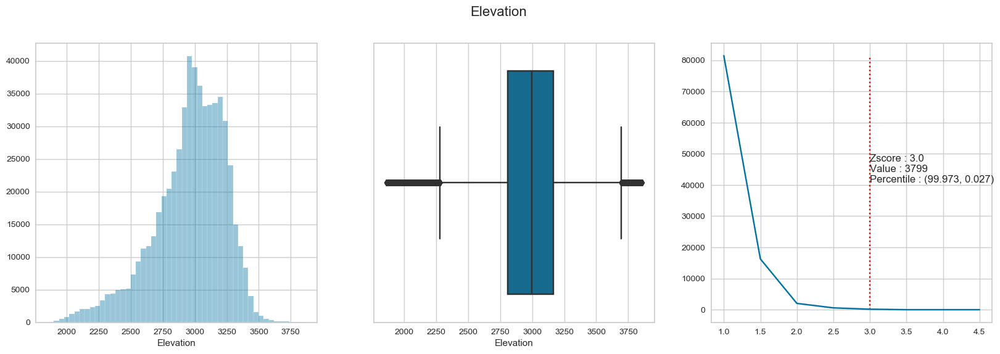

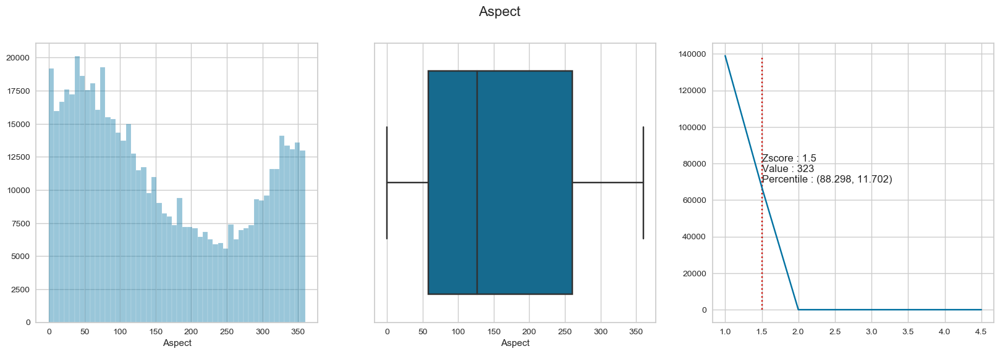

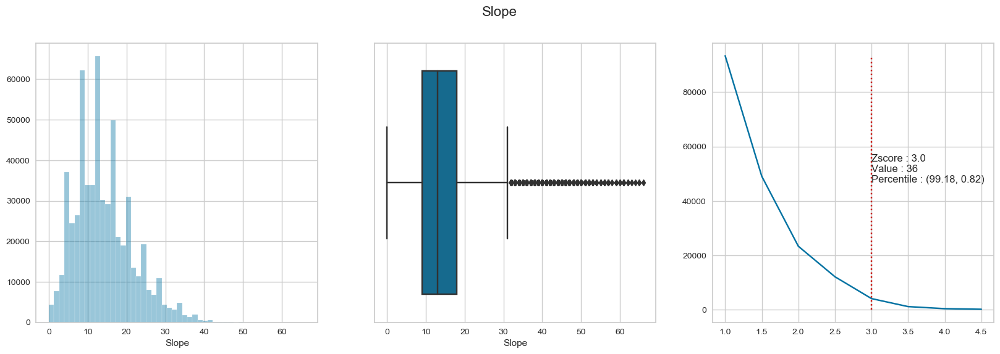

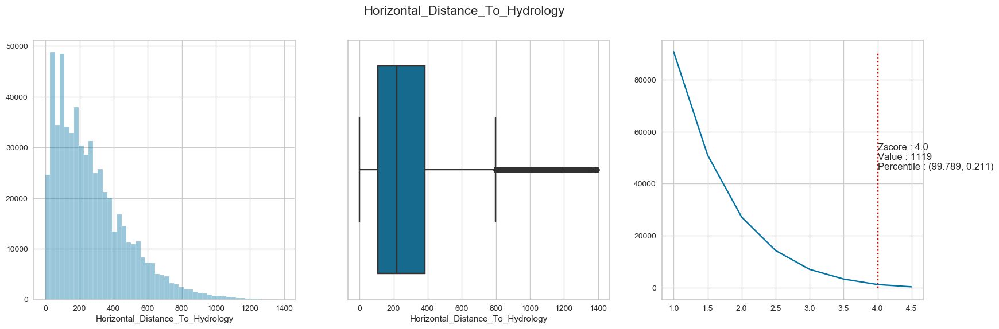

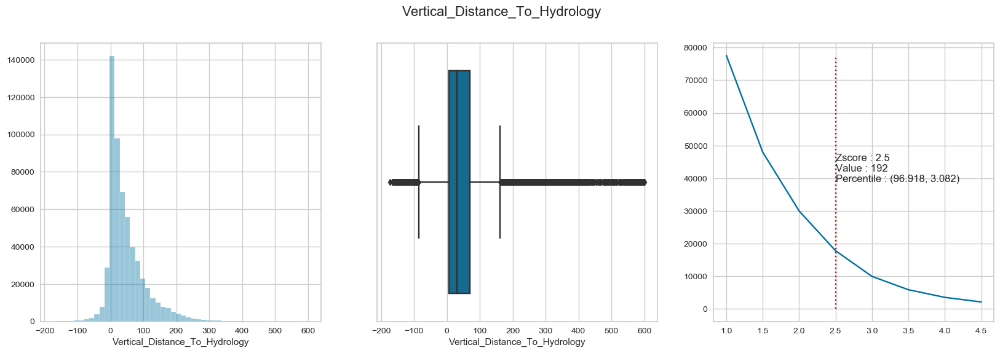

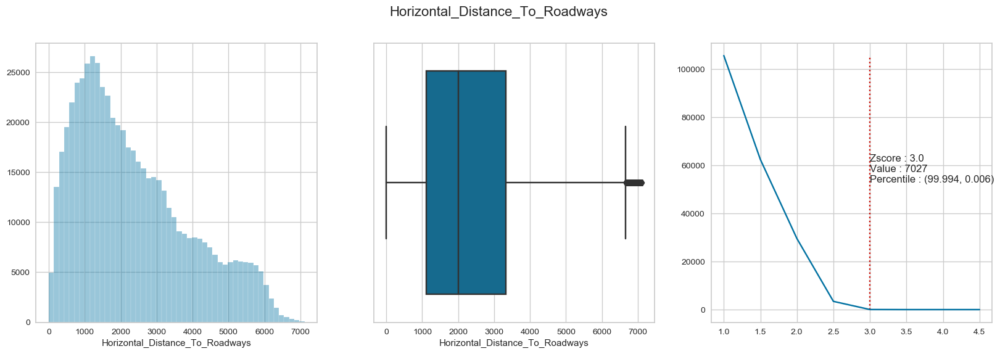

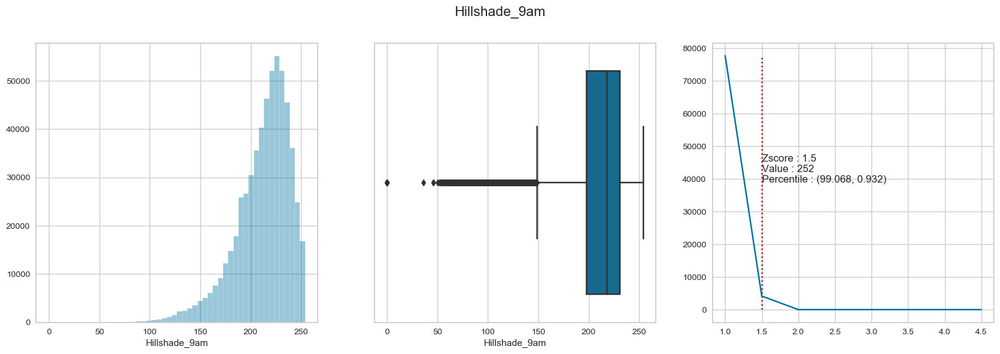

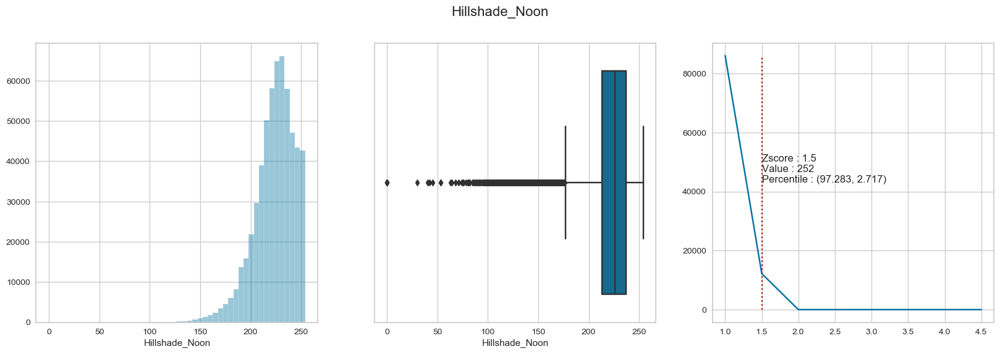

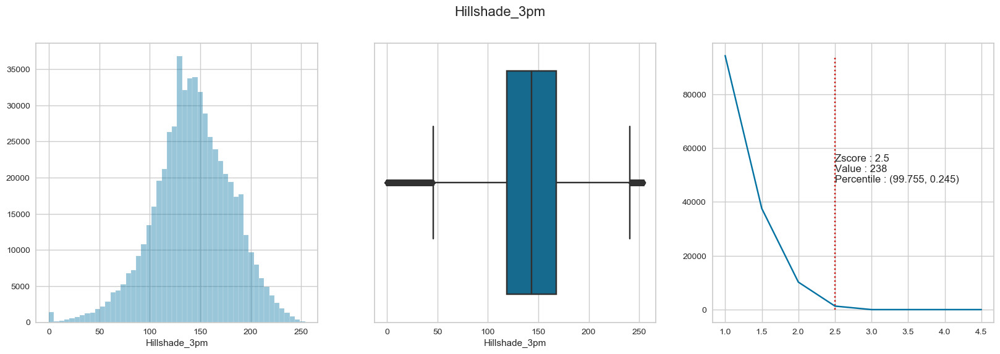

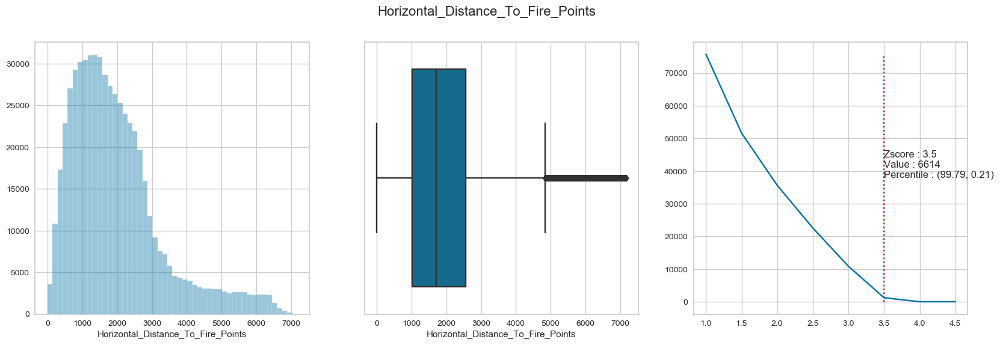

In [73]:
for col in numeric:
    outlier_inspect(tree, col)

### Deal with Outliers

#### *i. Visualize Zscore Tresholds (how many times IQR) by Continuous Variables*

There are many different methods for outliers. You can use IQR values used as standard to deal with outliers, or you can define two functions to help you understand the outliers and how you can deal with them.
- Two functions given as extra for outlier detection in *EDA Project (Outo Scout)* are given below.

In [74]:
def outlier_zscore(df, col, min_z=1, max_z = 5, step = 0.1, print_list = False):
    z_scores = zscore(df[col].dropna())
    threshold_list = []
    for threshold in np.arange(min_z, max_z, step):
        threshold_list.append((threshold, len(np.where(z_scores > threshold)[0])))
        df_outlier = pd.DataFrame(threshold_list, columns = ['threshold', 'outlier_count'])
        df_outlier['pct'] = (df_outlier.outlier_count - df_outlier.outlier_count.shift(-1))/df_outlier.outlier_count*100
    plt.plot(df_outlier.threshold, df_outlier.outlier_count)
    best_treshold = round(df_outlier.iloc[df_outlier.pct.argmax(), 0],2)
    outlier_limit = int(df[col].dropna().mean() + (df[col].dropna().std()) * df_outlier.iloc[df_outlier.pct.argmax(), 0])
    percentile_threshold = stats.percentileofscore(df[col].dropna(), outlier_limit)
    plt.vlines(best_treshold, 0, df_outlier.outlier_count.max(), 
               colors="r", ls = ":"
              )
    plt.annotate("Zscore : {}\nValue : {}\nPercentile : {}".format(best_treshold, outlier_limit, 
                                                                   (np.round(percentile_threshold, 3), 
                                                                    np.round(100-percentile_threshold, 3))), 
                 (best_treshold, df_outlier.outlier_count.max()/2))
    #plt.show()
    if print_list:
        print(df_outlier)
    return (plt, df_outlier, best_treshold, outlier_limit, percentile)

In [75]:
def outlier_inspect(df, col, min_z=1, max_z = 5, step = 0.5, max_hist = None, bins = 50):
    fig = plt.figure(figsize=(20, 6))
    fig.suptitle(col, fontsize=16)
    plt.subplot(1,3,1)
    if max_hist == None:
        sns.distplot(df[col], kde=False, bins = 50)
    else :
        sns.distplot(df[df[col]<=max_hist][col], kde=False, bins = 50)
    plt.subplot(1,3,2)
    sns.boxplot(df[col])
    plt.subplot(1,3,3)
    z_score_inspect = outlier_zscore(df, col, min_z=min_z, max_z = max_z, step = step)
    plt.show()

In [76]:
def detect_outliers(df, col_name):
    ''' 
    this function detects outliers based on 3 time IQR and
    returns the number of lower and uper limit and number of outliers respectively
    '''
    first_quartile = np.percentile(np.array(df[col_name].tolist()), 25)
    third_quartile = np.percentile(np.array(df[col_name].tolist()), 75)
    IQR = third_quartile - first_quartile
                      
    upper_limit = third_quartile+(3*IQR)
    lower_limit = first_quartile-(3*IQR)
    outlier_count = 0
                      
    for value in df[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1
    return lower_limit, upper_limit, outlier_count

**Let's see how many outliers are there of each Continuous Columns**

In [77]:
for col in numeric:
    if detect_outliers(tree, col)[2] > 0:
        print("There are {} outliers in {}".format(detect_outliers(tree, col)[2], col))

There are 275 outliers in Slope
There are 414 outliers in Horizontal_Distance_To_Hydrology
There are 5339 outliers in Vertical_Distance_To_Hydrology
There are 1027 outliers in Hillshade_9am
There are 1191 outliers in Hillshade_Noon
There are 10 outliers in Horizontal_Distance_To_Fire_Points




```
# This is formatted as code
```

### I will drop all rows which contain outliers in these four colums above

#### *ii. Drop Outliers*

You can define another function to detect outliers in accordance with the ``zscore`` (how many times IQR) value you choose according to the result from the previous functions.

In [78]:
tree1 = tree[(tree['Slope'] > detect_outliers(tree, 'Slope')[0]) &
              (tree['Slope'] < detect_outliers(tree, 'Slope')[1])]
tree1.shape

(580640, 55)

In [79]:
tree1 = tree1[(tree1['Horizontal_Distance_To_Fire_Points'] > detect_outliers(tree1, 'Horizontal_Distance_To_Fire_Points')[0]) &
              (tree1['Horizontal_Distance_To_Fire_Points'] < detect_outliers(tree1, 'Horizontal_Distance_To_Fire_Points')[1])]

tree1.shape

(580630, 55)

In [80]:
tree1 = tree1[(tree1['Horizontal_Distance_To_Hydrology'] > detect_outliers(tree1, 'Horizontal_Distance_To_Hydrology')[0]) &
              (tree1['Horizontal_Distance_To_Hydrology'] < detect_outliers(tree1, 'Horizontal_Distance_To_Hydrology')[1])]

tree1.shape

(580216, 55)

In [81]:
tree1 = tree1[(tree1['Vertical_Distance_To_Hydrology'] > detect_outliers(tree1, 'Vertical_Distance_To_Hydrology')[0]) &
              (tree1['Vertical_Distance_To_Hydrology'] < detect_outliers(tree1, 'Vertical_Distance_To_Hydrology')[1])]

tree1.shape

(574967, 55)

In [82]:
len(tree) - len(tree1)

6045

In [83]:
tree1 = tree1.reset_index(drop=True)

In [84]:
tree1.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,0,0,5




```
# This is formatted as code
```

### My target column is `Cover_Type`. So let's take a close look at this column.

In [85]:
for i in range(1,8) :
    print("the shape of the value of", i, tree1[tree1["Cover_Type"] == i].shape)

the shape of the value of 1 (210004, 55)
the shape of the value of 2 (280193, 55)
the shape of the value of 3 (35546, 55)
the shape of the value of 4 (2741, 55)
the shape of the value of 5 (9453, 55)
the shape of the value of 6 (17345, 55)
the shape of the value of 7 (19685, 55)


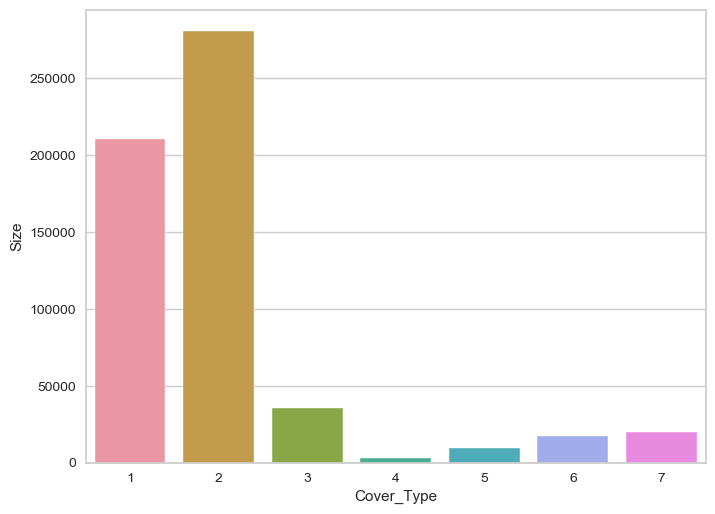

In [86]:
class_tree = tree1.groupby('Cover_Type').size()
class_label = pd.DataFrame(class_tree,columns = ['Size'])
plt.figure(figsize = (8,6))
sns.barplot(x = class_label.index, y = 'Size', data = class_label)

- We can see that we have unbalanced data (`Cover_Type`). But, additionally I would like to check the distribution of each class of ``Cover_Type`` in terms of percentages.

In [87]:
for i, number in enumerate(class_tree):
    percent = (number/class_tree.sum())
    print('Cover_Type', class_tree.index[i])
    print('%.2f'% percent)

Cover_Type 1
0.37
Cover_Type 2
0.49
Cover_Type 3
0.06
Cover_Type 4
0.00
Cover_Type 5
0.02
Cover_Type 6
0.03
Cover_Type 7
0.03


### Now, let's take a closer look at correlation of continuous columns.

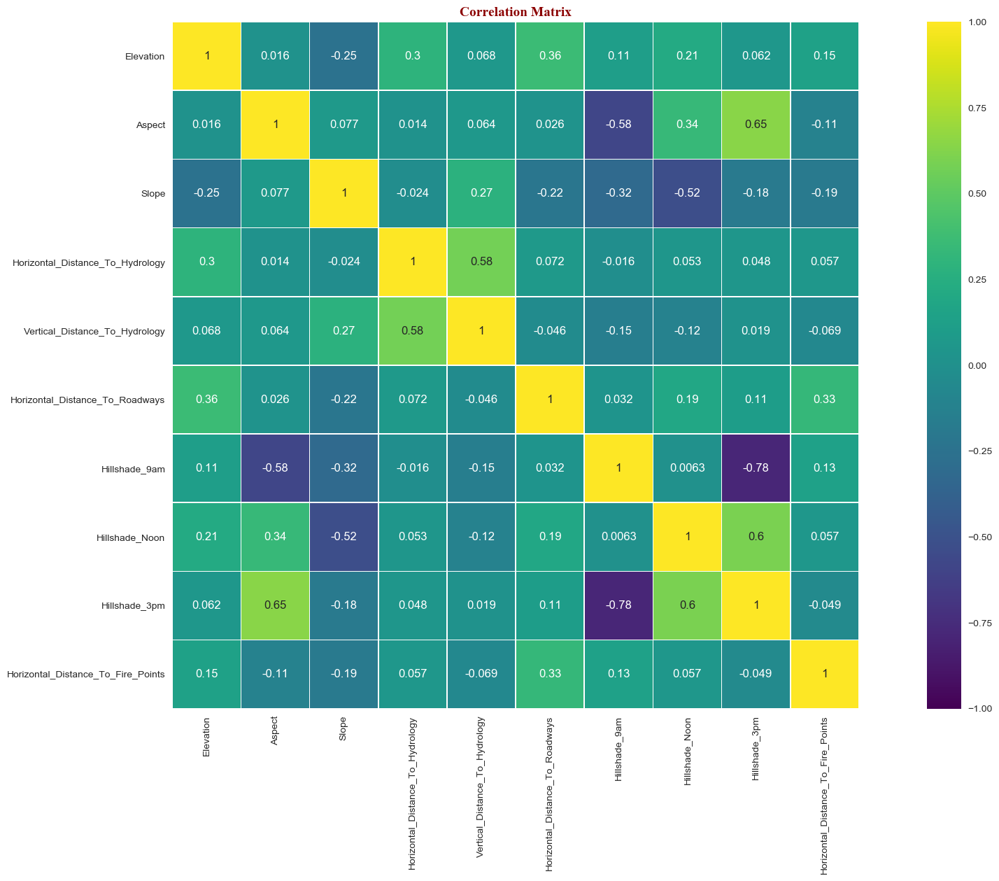

In [88]:
corr_matrix = tree1[numeric].corr()

plt.figure(figsize=(25, 13))
sns.heatmap(corr_matrix,square=True, annot=True, linewidths=.5, vmin=-1, vmax=1, cmap='viridis')
plt.title("Correlation Matrix", fontdict=font_title)

plt.show()

>### Summary results :
>- ``Hillshade_3pm`` and ``Hillshade_9am`` are highly correlated. So I decided to drop ``Hillshade_3pm``.
>- ``Horizontal_Distance_To_Hydrology`` and ``Vertical_Distance_To_Hydrology`` columns somehow are not correlated (0.58) enough, so I decided to transform a new column derived from these two columns.
>- ``Horizontal_Distance_To_Hydrology`` and ``Horizontal_Distance_To_Roadways`` are not correlated (0.072) , so I decided to transform a new column derived from these two columns.
>- ``Vertical_Distance_To_Hydrology`` and ``Elevation`` are not correlated (0.068) , so I decided to transform a new column derived from these two columns.

In [89]:
tree1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 574967 entries, 0 to 574966
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           574967 non-null  int64
 1   Aspect                              574967 non-null  int64
 2   Slope                               574967 non-null  int64
 3   Horizontal_Distance_To_Hydrology    574967 non-null  int64
 4   Vertical_Distance_To_Hydrology      574967 non-null  int64
 5   Horizontal_Distance_To_Roadways     574967 non-null  int64
 6   Hillshade_9am                       574967 non-null  int64
 7   Hillshade_Noon                      574967 non-null  int64
 8   Hillshade_3pm                       574967 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  574967 non-null  int64
 10  Wilderness_Area1                    574967 non-null  int64
 11  Wilderness_Area2                    574967 non-null 

In [90]:
tree1.to_csv("covtype_EDA.csv", index = False)

***
***

## 3. Feature Engineering with *sqlite3* Library

Feature engineering is an optional process to increase the predictive success of the model. The effort you put in should be worth increasing success. So you can develop your own feature engineering approach.

Note that, after seeing the result of the models, there may be a possibility of making minor changes to the features in the modeling phase.

You are requested to do feature engineering operations with SQL. There are two ways to do this:
1. After moving the final version of your data set to ***SQLite Browser*** and performing feature engineering operations there, you can convert the resulting data set to dataframe format and use it again in python.
2. In Python, you can create a database and table with your data set by using the functions of the sqlite3 library, after performing feature engineering with SQL, you can convert the resulting data set to a dataframe.

In this case, we will illustrate the second method.

Follow the steps below to do feature engineering with the [sqlite3](https://docs.python.org/3/library/sqlite3.html) library:
 1. Import *sqlite3* library
 2. Create a sqlite database (``"tree_database"``) and transferring dataframe(``tree1``) from python into database table (``covtype2``)
  - You can use *connect(), to_sql() and read_sql_query()* functions.
 3. Assign SQL codes for feature engineering to an object. (produce or transform new columns, get rid of unnecassary columns, make the dataset ready to model)
 4. Transform final version of SQL table to dataframe.
 
Finally, you can save the final version of your data as csv for use in your models and work on a different notebook. On the other hand, you can continue to work on this notebook with the last dataframe.

### My Plan of Feature Extraction
- First, I decided to produce&transform a new column with ``Horizontal_Distance_To_Hydrology`` and ``Vertical_Distance_To_Hydrology`` columns. New column will contain the values of **Hypotenuse** of ``horizantal`` and ``vertical`` distances.

- As second, we can produce&transform an additional column which contains **average** of Horizantal Distances to Hydrology and Roadways.

- Third, I decided to transform a new column which contains **average** of `Elevation` and ``Vertical_Distance_To_Hydrology`` columns. So that, there is no need to have ``Horizontal_Distance_To_Hydrology`` and ``Vertical_Distance_To_Hydrology`` columns, because I have new columns which represent more value than them. I decide to drop these columns.

- Lastly, I will drop unnecessary columns ``'Hillshade_3pm', 'Soil_Type7', 'Soil_Type8', 'Soil_Type14', 'Soil_Type15', 'Soil_Type21', 'Soil_Type25', 'Soil_Type28', 'Soil_Type36', 'Soil_Type37'``) that I conclued previously.

- Note that, after seeing the result of the models, there may be a possibility of making minor changes to the features in the modeling phase.

In [91]:
import sqlite3

- Creation a ``sqlite`` database (``"tree_database"``) and transferring dataframe(``tree1``) from python into database table (``covtype2``)

In [92]:
# Creation of the connection and importing dataframe into database.
with sqlite3.connect("tree_database.db") as cnnct:
    tree1.to_sql("covtype2", cnnct, if_exists = "replace")

In [93]:
query1 = """SELECT *,
(Horizontal_Distance_To_Hydrology*Horizontal_Distance_To_Hydrology)+(Vertical_Distance_To_Hydrology*Vertical_Distance_To_Hydrology) as Square_Hypo_Distance,
(Horizontal_Distance_To_Hydrology + Horizontal_Distance_To_Roadways)/2 as Average_Dist_Road_Hydro, (Elevation + Vertical_Distance_To_Hydrology) /2 as Average_Elevation_Hydro
FROM covtype2;"""

In [94]:
query2 = """SELECT Elevation, Aspect, Slope, Horizontal_Distance_To_Roadways, Hillshade_9am, Hillshade_Noon, Horizontal_Distance_To_Fire_Points, Wilderness_Area1, Wilderness_Area2, Wilderness_Area3,
Wilderness_Area4, Soil_Type1, Soil_Type2, Soil_Type3, Soil_Type4, Soil_Type5, Soil_Type6,
Soil_Type9, Soil_Type10, Soil_Type11, Soil_Type12, Soil_Type13, Soil_Type16, Soil_Type17, 
Soil_Type18, Soil_Type19, Soil_Type20, Soil_Type22, Soil_Type23, Soil_Type24, 
Soil_Type26, Soil_Type27, Soil_Type29, Soil_Type30, Soil_Type31, Soil_Type32, Soil_Type33, 
Soil_Type34, Soil_Type35, Soil_Type38, Soil_Type39, Soil_Type40, Cover_Type,
Square_Hypo_Distance, Average_Dist_Road_Hydro, Average_Elevation_Hydro
FROM covtype2;"""

In [95]:
with sqlite3.connect("tree_database.db") as cnnct:
    df1 = pd.read_sql_query(query1, cnnct)  # transforming and exporting to df1
    df1.to_sql("covtype2", cnnct, if_exists = "replace")  # importing again to dropping columns
    df2 = pd.read_sql_query(query2, cnnct)  # exporting table to df2

In [96]:
df2.to_csv("covtype2.csv", index = False)

***
***

## 4. Prediction (Multi-class Classification)

If you have done, use your data set resulting from Feature Engineering task. If you haven't done Feature Engineering, use the latest version of your data set.
In this section, you have two main tasks that apply to each algorithm:
1. Model Building and Prediction

 - XGBoost (Use ``XGBClassifier`` model from``xgboost`` module)
 - SVM (Use ``LinearSVC`` model from``sklearn.svm`` module)
 - Decision Tree (Use ``DecisionTreeClassifier`` model from ``sklearn.tree`` module)
 - KNN (Use ``KNeighborsClassifier`` model from ``sklearn.neighbors`` module)
 - Random Forest (Use ``RandomForestClassifier`` model from ``sklearn.ensemble`` module) 
 

2. Visualizing the Result

- Use [yellowbrick](https://www.scikit-yb.org/en/latest/), [seaborn](https://seaborn.pydata.org/tutorial/regression.html) or [matplotlib](https://matplotlib.org/) modules to visualize the model results.

- Show three plots for the results:
 - Class Prediction Error Bar Plot
 - Confusion Matrix
 - Classification Report

### Import Libraries

In [38]:
pip install yellowbrick

  Using cached yellowbrick-1.2-py3-none-any.whl (269 kB)
Note: you may need to restart the kernel to use updated packages.


In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sqlalchemy import create_engine
import warnings
from IPython.core.pylabtools import figsize
from scipy.stats import zscore
from scipy import stats
from numpy import percentile
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from statsmodels.formula.api import ols
from scipy.stats import zscore
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
import seaborn as sns
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from yellowbrick.classifier import ClassificationReport
from yellowbrick.datasets import load_occupancy
from sklearn.metrics import f1_score
font_title = {'family': 'times new roman', 'color': 'darkred', 
              'weight': 'bold', 'size': 14}

warnings.filterwarnings('ignore')
sns.set_style("whitegrid")

plt.rcParams['figure.dpi'] = 100

### Data Preprocessing

- Drop target variable
- Train-Test Split

*Note: You can use the train and test data generated here for all algorithms.*

In [45]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import warnings
from sklearn.metrics import confusion_matrix, accuracy_score, mean_squared_error, r2_score, roc_auc_score, roc_curve, classification_report
from IPython.core.pylabtools import figsize
from scipy.stats import zscore
from scipy import stats
from numpy import percentile
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier , GradientBoostingClassifier
import seaborn as sns
from xgboost import XGBClassifier
from sklearn.model_selection import TimeSeriesSplit
from yellowbrick.classifier import ClassificationReport
from yellowbrick.datasets import load_occupancy
from sklearn.metrics import f1_score
font_title = {'family': 'times new roman', 'color': 'darkred',
              'weight': 'bold', 'size': 14}
warnings.filterwarnings('ignore')
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 100

In [106]:
df = pd.read_csv("covtype2.csv")
df.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,...,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Square_Hypo_Distance,Average_Dist_Road_Hydro,Average_Elevation_Hydro
0,2596,51,3,510,221,232,6279,1,0,0,...,0,0,0,0,0,0,5,66564,384,1298
1,2590,56,2,390,220,235,6225,1,0,0,...,0,0,0,0,0,0,5,44980,301,1292
2,2804,139,9,3180,234,238,6121,1,0,0,...,0,0,0,0,0,0,2,76049,1724,1434
3,2785,155,18,3090,238,238,6211,1,0,0,...,0,0,0,0,0,0,2,72488,1666,1451
4,2595,45,2,391,220,234,6172,1,0,0,...,0,0,0,0,0,0,5,23410,272,1297


In [107]:
## Normalde Smote uygulmak gerekli aslinda ama uygulayamadik.
## Oversampling biz.
##Smote sentetik bir veri olusturuyor, veri dengesizse.

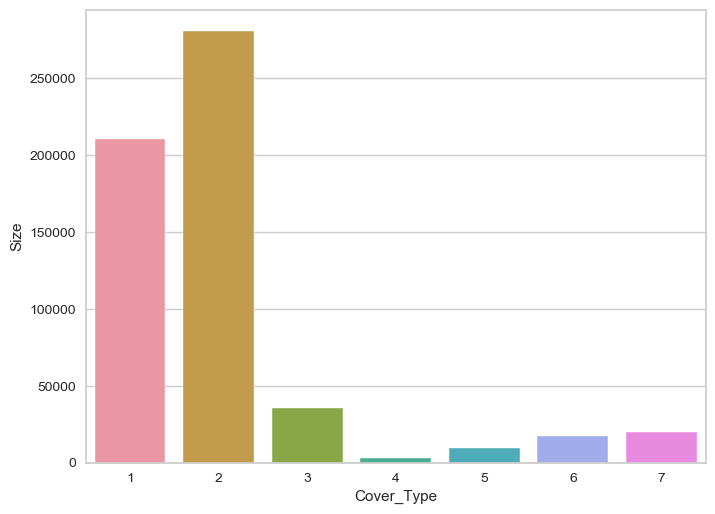

In [108]:
class_tree = df.groupby('Cover_Type').size()
class_label = pd.DataFrame(class_tree,columns = ['Size'])
plt.figure(figsize = (8,6))
sns.barplot(x = class_label.index, y = 'Size', data = class_label)

In [109]:
len(df[df["Cover_Type"]==4])

2741

In [110]:
df[df["Cover_Type"]==1] = df[df["Cover_Type"]==1].sample(1500) ### Sample belirledik hepsi icin.

In [111]:
df[df["Cover_Type"]==1]

,Elevation,Aspect,Slope,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,...,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Square_Hypo_Distance,Average_Dist_Road_Hydro,Average_Elevation_Hydro
151,2926.0,289.0,24.0,5126.0,145.0,228.0,4814.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,53901.0,2668.0,1512.0
323,3201.0,53.0,7.0,3667.0,224.0,225.0,4255.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,238820.0,2077.0,1613.0
515,2965.0,142.0,6.0,4778.0,229.0,239.0,3283.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2389.0,1482.0
768,3021.0,68.0,8.0,4134.0,228.0,225.0,2493.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,41077.0,2167.0,1523.0
6302,3037.0,109.0,19.0,778.0,248.0,216.0,2028.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7954.0,431.0,1532.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
557658,2619.0,43.0,16.0,2430.0,221.0,203.0,2305.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1215.0,1309.0
557752,2776.0,56.0,22.0,3210.0,228.0,187.0,2630.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,306593.0,1881.0,1374.0
558205,2822.0,31.0,13.0,3303.0,216.0,210.0,2586.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,285237.0,1918.0,1415.0
558727,2861.0,12.0,26.0,3373.0,185.0,179.0,2509.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,265473.0,1943.0,1454.0


In [112]:
df[df["Cover_Type"] == 2] = df[df["Cover_Type"] == 2].sample(1500)
df[df["Cover_Type"] == 3] = df[df["Cover_Type"] == 3].sample(1500)
df[df["Cover_Type"] == 4] = df[df["Cover_Type"] == 4].sample(1500)
df[df["Cover_Type"] == 5] = df[df["Cover_Type"] == 5].sample(1500)
df[df["Cover_Type"] == 6] = df[df["Cover_Type"] == 6].sample(1500)
df[df["Cover_Type"] == 7] = df[df["Cover_Type"] == 7].sample(1500)

In [113]:
df.dropna(inplace=True)

In [114]:
df.shape

(10500, 46)

In [115]:
 d = df

In [116]:
for i in range(1,8) :
    d[d["Cover_Type"] == i] = d[d["Cover_Type"] == i].sample(1500)
    print(d[d["Cover_Type"] == i])

        Elevation  Aspect  Slope  Horizontal_Distance_To_Roadways  \
151        2926.0   289.0   24.0                           5126.0   
323        3201.0    53.0    7.0                           3667.0   
515        2965.0   142.0    6.0                           4778.0   
768        3021.0    68.0    8.0                           4134.0   
6302       3037.0   109.0   19.0                            778.0   
...           ...     ...    ...                              ...   
557658     2619.0    43.0   16.0                           2430.0   
557752     2776.0    56.0   22.0                           3210.0   
558205     2822.0    31.0   13.0                           3303.0   
558727     2861.0    12.0   26.0                           3373.0   
558841     2832.0    51.0   18.0                           2958.0   

        Hillshade_9am  Hillshade_Noon  Horizontal_Distance_To_Fire_Points  \
151             145.0           228.0                              4814.0   
323             2

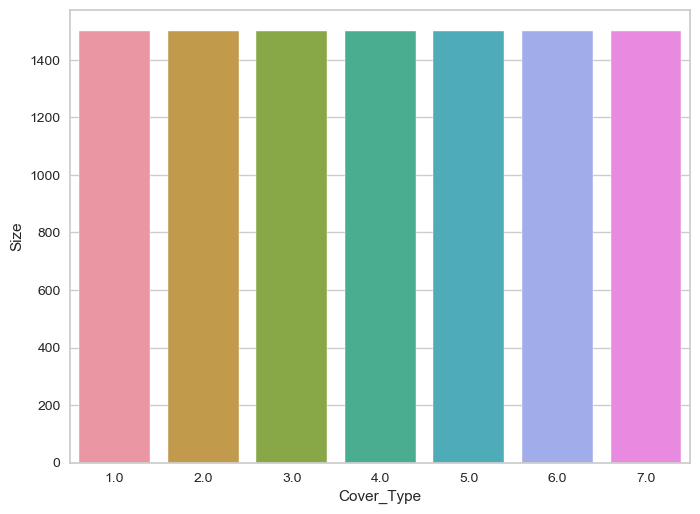

In [117]:
class_tree = df.groupby('Cover_Type').size()
class_label = pd.DataFrame(class_tree,columns = ['Size'])
plt.figure(figsize = (8,6))
sns.barplot(x = class_label.index, y = 'Size', data = class_label)

In [118]:
### Verimizi dengeli bir hala getirdik data processing yaptik.

In [119]:
X = df.drop("Cover_Type", axis=1)
y = df["Cover_Type"]

In [120]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [121]:
X_train.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type38,Soil_Type39,Soil_Type40,Square_Hypo_Distance,Average_Dist_Road_Hydro,Average_Elevation_Hydro
141583,2944.0,47.0,10.0,4711.0,224.0,218.0,2140.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,909.0,2370.0,1473.0
289248,2486.0,18.0,12.0,560.0,211.0,215.0,1570.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,105365.0,436.0,1286.0
567108,2380.0,155.0,20.0,295.0,239.0,237.0,816.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,79754.0,286.0,1217.0
499108,3031.0,283.0,25.0,2769.0,145.0,232.0,2431.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,85000.0,1519.0,1570.0
394186,2961.0,106.0,30.0,1933.0,254.0,187.0,691.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,210305.0,1168.0,1589.0


In [ ]:
X_train.info()

In [139]:
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

## XGBoost Classifier
### Import the modul
### Fit the model
### Predict the test set
### Visualize and evaluate the result (use yellowbrick module)

In [140]:
xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train,y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [123]:
y_pred = xgb_classifier.predict(X_test)

In [124]:
xgb_accuracy = accuracy_score(y_test, y_pred)
xgb_accuracy

0.8333333333333334

In [125]:
xgb_f1 = f1_score(y_test, y_pred, average='macro')
xgb_f1

0.8269721917528144

In [126]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         1.0       0.77      0.64      0.70       318
         2.0       0.69      0.62      0.65       274
         3.0       0.85      0.81      0.83       298
         4.0       0.93      0.96      0.94       327
         5.0       0.86      0.96      0.91       302
         6.0       0.81      0.85      0.83       299
         7.0       0.88      0.98      0.92       282

    accuracy                           0.83      2100
   macro avg       0.83      0.83      0.83      2100
weighted avg       0.83      0.83      0.83      2100



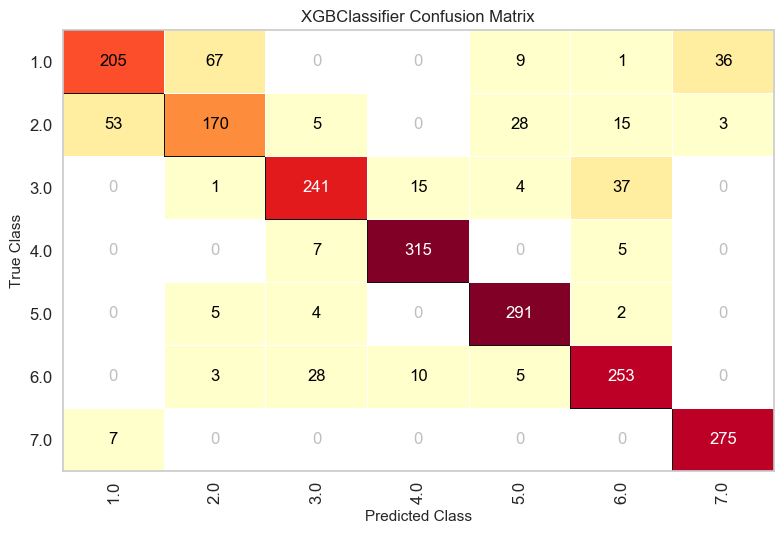

In [127]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ConfusionMatrix
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(xgb_classifier)
# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)
# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)
cm.show()

## Tuning XGBoost

In [128]:
xgb = XGBClassifier()

In [129]:
xgb_params = {"n_estimators": [50, 100, 300],
             "subsample":[0.5,0.8,1],
             "max_depth":[3,5,7],
             "learning_rate":[0.1,0.01,0.3]}

In [130]:
xgb_cv_model = GridSearchCV(xgb, xgb_params, cv = 2,
                            n_jobs = -1, verbose = 2).fit(X_train, y_train)

Fitting 2 folds for each of 81 candidates, totalling 162 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   55.0s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 162 out of 162 | elapsed:  8.0min finished


In [131]:
xgb_cv_model.best_params_

{'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'subsample': 0.8}

In [132]:
xgb_tuned = XGBClassifier(learning_rate= 0.1,
                                max_depth= 7,
                                n_estimators= 300,
                                subsample= 0.5).fit(X_train, y_train)

In [133]:
y_pred = xgb_tuned.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[211,  65,   0,   0,  10,   1,  31],
       [ 52, 178,   7,   0,  21,  13,   3],
       [  0,   2, 246,  13,   2,  35,   0],
       [  0,   0,   5, 316,   0,   6,   0],
       [  1,   6,   3,   0, 289,   3,   0],
       [  0,   2,  27,   8,   6, 256,   0],
       [  8,   0,   0,   0,   0,   0, 274]], dtype=int64)

In [134]:
xgb_f1_tuned = f1_score(y_test, y_pred, average='macro')
xgb_f1_tuned

0.8376691642718185

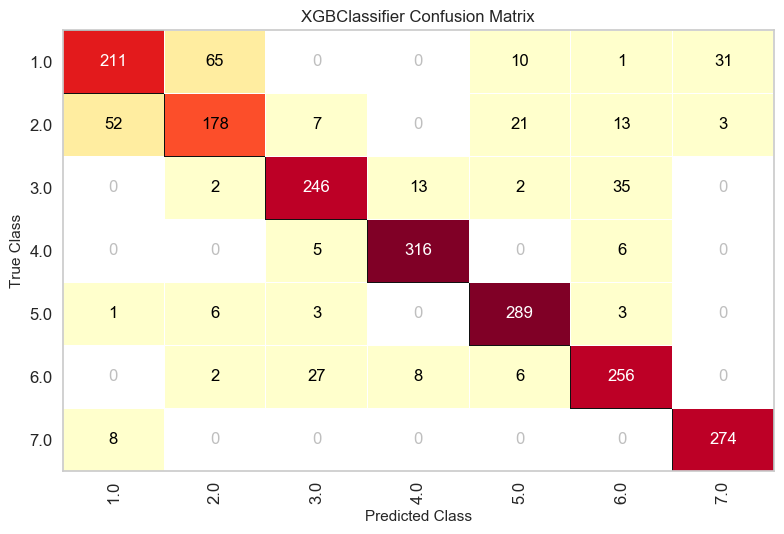

In [135]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ConfusionMatrix
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(xgb_tuned)
# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)
# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)
cm.show()

In [136]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.78      0.66      0.72       318
         2.0       0.70      0.65      0.68       274
         3.0       0.85      0.83      0.84       298
         4.0       0.94      0.97      0.95       327
         5.0       0.88      0.96      0.92       302
         6.0       0.82      0.86      0.84       299
         7.0       0.89      0.97      0.93       282

    accuracy                           0.84      2100
   macro avg       0.84      0.84      0.84      2100
weighted avg       0.84      0.84      0.84      2100



## XGBoost Scaled

In [141]:
xgb_tuned_scaled = XGBClassifier(learning_rate= 0.1,
                                max_depth= 7,
                                n_estimators= 300,
                                subsample= 0.5).fit(X_train_scaled, y_train)

In [142]:
y_pred = xgb_tuned_scaled.predict(X_test_scaled)
confusion_matrix(y_test, y_pred)

array([[212,  64,   0,   0,  10,   1,  31],
       [ 52, 178,   6,   0,  23,  12,   3],
       [  0,   3, 245,  14,   2,  34,   0],
       [  0,   0,   5, 314,   0,   8,   0],
       [  1,   7,   4,   0, 287,   3,   0],
       [  0,   2,  23,  11,   5, 258,   0],
       [  8,   0,   0,   0,   0,   0, 274]], dtype=int64)

In [143]:
xgb_f1_tuned_scaled = f1_score(y_test, y_pred, average='macro')
xgb_f1_tuned_scaled

0.8369120738793774

In [144]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

         1.0       0.78      0.67      0.72       318
         2.0       0.70      0.65      0.67       274
         3.0       0.87      0.82      0.84       298
         4.0       0.93      0.96      0.94       327
         5.0       0.88      0.95      0.91       302
         6.0       0.82      0.86      0.84       299
         7.0       0.89      0.97      0.93       282

    accuracy                           0.84      2100
   macro avg       0.84      0.84      0.84      2100
weighted avg       0.84      0.84      0.84      2100



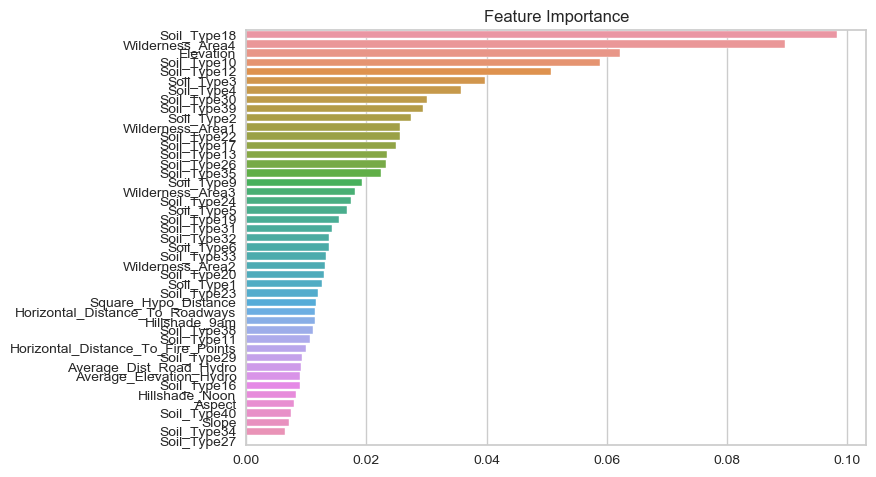

<Figure size 2000x1000 with 0 Axes>

<Figure size 2000x1000 with 0 Axes>

In [145]:
feature_imp = pd.Series(xgb_tuned_scaled.feature_importances_,
                        index=X_train.columns).sort_values(ascending=False)
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.title("Feature Importance")
plt.show()
plt.figure(figsize=(20,10))

## Random Forest

In [146]:
rf_model=RandomForestClassifier().fit(X_train, y_train)

In [147]:
y_pred_rf = rf_model.predict(X_test)
confusion_matrix(y_test, y_pred_rf)

array([[214,  63,   0,   0,   9,   1,  31],
       [ 50, 174,   8,   0,  28,  12,   2],
       [  0,   1, 244,  14,   3,  36,   0],
       [  0,   0,   4, 321,   0,   2,   0],
       [  0,   4,   4,   0, 293,   1,   0],
       [  0,   2,  27,  12,   3, 255,   0],
       [  6,   1,   0,   0,   0,   0, 275]], dtype=int64)

In [148]:
rf_f1 = f1_score(y_test, y_pred_rf, average='macro')
rf_f1

0.8396292175870519

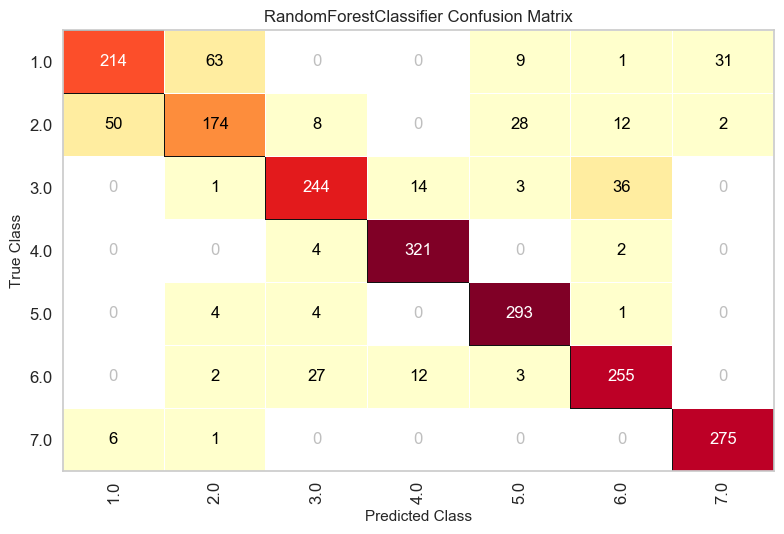

In [149]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ConfusionMatrix
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(rf_model)
# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)
# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)
cm.show()

In [150]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

         1.0       0.79      0.67      0.73       318
         2.0       0.71      0.64      0.67       274
         3.0       0.85      0.82      0.83       298
         4.0       0.93      0.98      0.95       327
         5.0       0.87      0.97      0.92       302
         6.0       0.83      0.85      0.84       299
         7.0       0.89      0.98      0.93       282

    accuracy                           0.85      2100
   macro avg       0.84      0.84      0.84      2100
weighted avg       0.84      0.85      0.84      2100



## Random Forest Tunning

In [151]:
rf = RandomForestClassifier()

In [152]:
rf_params = {"n_estimators":[50, 100, 300],
              "max_depth":[3,5,7],
              "max_features": [2,4,6,8],
              "min_samples_split": [2,4,6]}

In [153]:
rf_cv_model = GridSearchCV(rf, rf_params, cv = 5, n_jobs = -1, verbose = 2).fit(X_train, y_train)

Fitting 5 folds for each of 108 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    6.7s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:   29.5s
[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:  2.3min finished


In [154]:
rf_cv_model.best_params_

{'max_depth': 7,
 'max_features': 8,
 'min_samples_split': 4,
 'n_estimators': 300}

In [155]:
rf_tuned = RandomForestClassifier(max_depth = 7,
                                  max_features = 8,
                                  min_samples_split = 2,
                                  n_estimators = 300).fit(X_train, y_train)
##rf_tuned = RandomForestClassifier(**rf_cv_model.best_params_).fit(X_train, y_train)

In [156]:
y_pred = rf_tuned.predict(X_test)
confusion_matrix(y_test, y_pred)


array([[179,  54,   0,   0,  26,   2,  57],
       [ 63, 135,   9,   0,  50,  11,   6],
       [  0,   1, 170,  41,  19,  67,   0],
       [  0,   0,   1, 318,   0,   8,   0],
       [  0,  21,  15,   0, 260,   6,   0],
       [  0,   0,  35,  21,  25, 218,   0],
       [ 12,   0,   0,   0,   1,   0, 269]], dtype=int64)

In [157]:
rf_f1_tuned = f1_score(y_test, y_pred, average='macro')
rf_f1_tuned

0.7253204296505478

In [158]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.70      0.56      0.63       318
         2.0       0.64      0.49      0.56       274
         3.0       0.74      0.57      0.64       298
         4.0       0.84      0.97      0.90       327
         5.0       0.68      0.86      0.76       302
         6.0       0.70      0.73      0.71       299
         7.0       0.81      0.95      0.88       282

    accuracy                           0.74      2100
   macro avg       0.73      0.73      0.73      2100
weighted avg       0.73      0.74      0.73      2100



## Random Forest Scaled

In [159]:
rf_tuned_scaled = RandomForestClassifier(max_depth = 7,
                                  max_features = 8,
                                  min_samples_split = 6,
                                  n_estimators = 300).fit(X_train_scaled, y_train)

In [160]:
y_pred = rf_tuned_scaled.predict(X_test_scaled)
confusion_matrix(y_test, y_pred)

array([[182,  53,   0,   0,  25,   2,  56],
       [ 64, 133,   7,   0,  52,  12,   6],
       [  0,   1, 172,  38,  20,  67,   0],
       [  0,   0,   4, 318,   0,   5,   0],
       [  0,  19,  14,   0, 262,   7,   0],
       [  0,   0,  37,  20,  26, 216,   0],
       [ 12,   0,   0,   0,   1,   0, 269]], dtype=int64)

In [161]:
rf_f1_tuned_scaled = f1_score(y_test, y_pred, average='macro')
rf_f1_tuned_scaled

0.7267467057585041

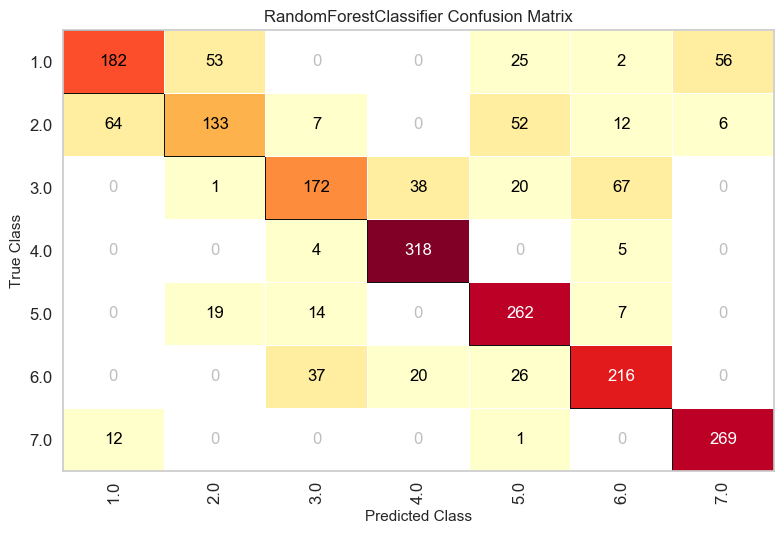

In [162]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split as tts
from yellowbrick.classifier import ConfusionMatrix
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(rf_tuned_scaled)
# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train_scaled, y_train)
# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test_scaled, y_test)
cm.show()

In [163]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.71      0.57      0.63       318
         2.0       0.65      0.49      0.55       274
         3.0       0.74      0.58      0.65       298
         4.0       0.85      0.97      0.90       327
         5.0       0.68      0.87      0.76       302
         6.0       0.70      0.72      0.71       299
         7.0       0.81      0.95      0.88       282

    accuracy                           0.74      2100
   macro avg       0.73      0.74      0.73      2100
weighted avg       0.73      0.74      0.73      2100



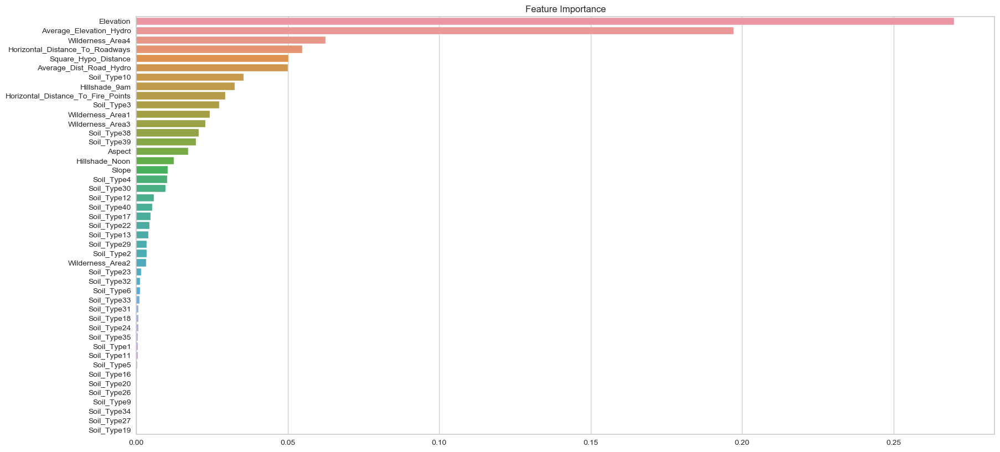

In [164]:
plt.figure(figsize=(20,10))
feature_imp = pd.Series(rf_tuned_scaled.feature_importances_,
                        index=X_train.columns).sort_values(ascending=False)
sns.barplot(x=feature_imp, y=feature_imp.index)
plt.title("Feature Importance")
plt.show()

Imported AutoViz_Class version: 0.0.81. Call using:
    from autoviz.AutoViz_Class import AutoViz_Class
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 saves plots in your local machine under AutoViz_Plots directory and does not display charts.
Shape of your Data Set: (10500, 46)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...


    Number of Numeric Columns =  10
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  35
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    45 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification VISUALIZATION Started #####################


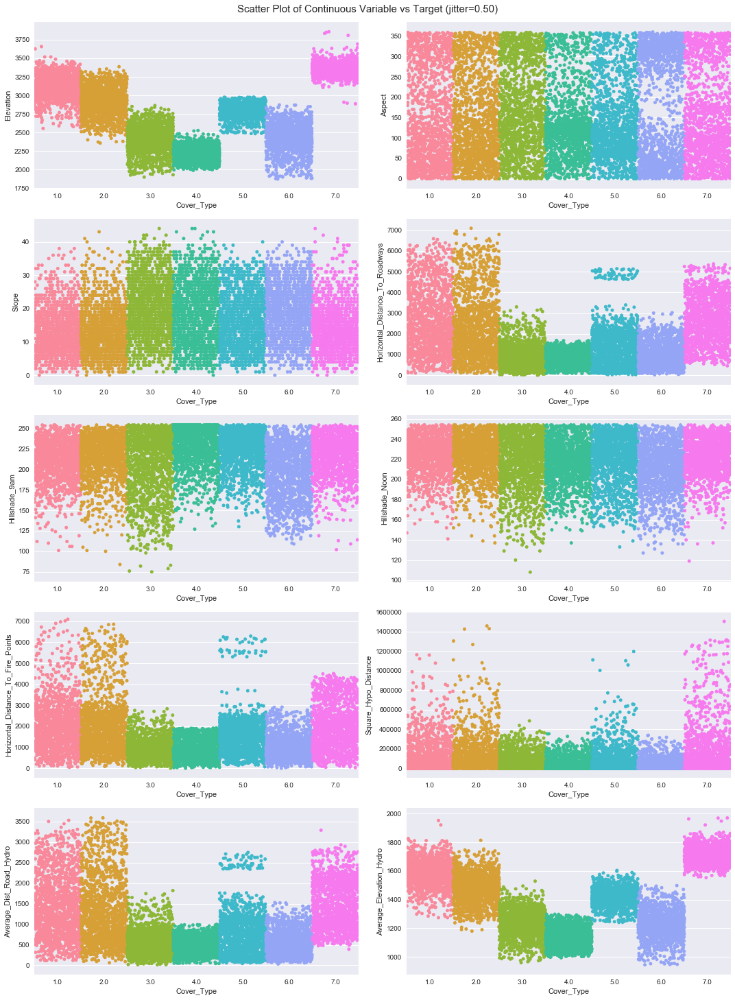

Total Number of Scatter Plots = 55


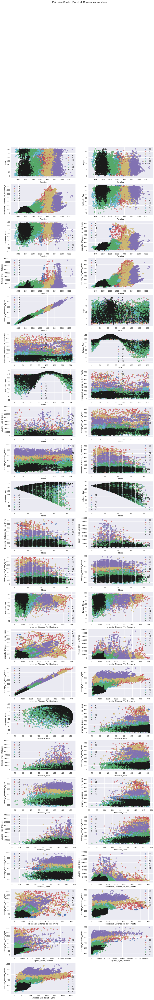

No handles with labels found to put in legend.


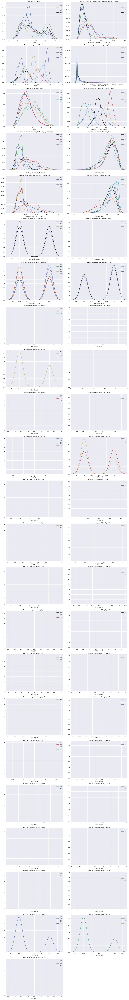

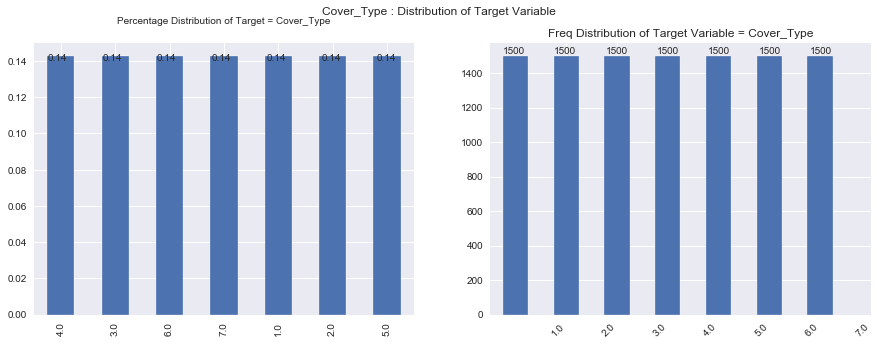

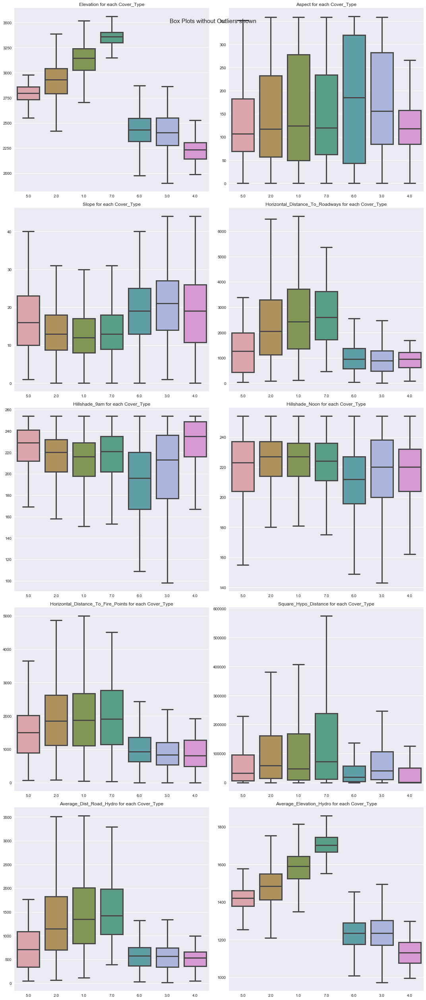

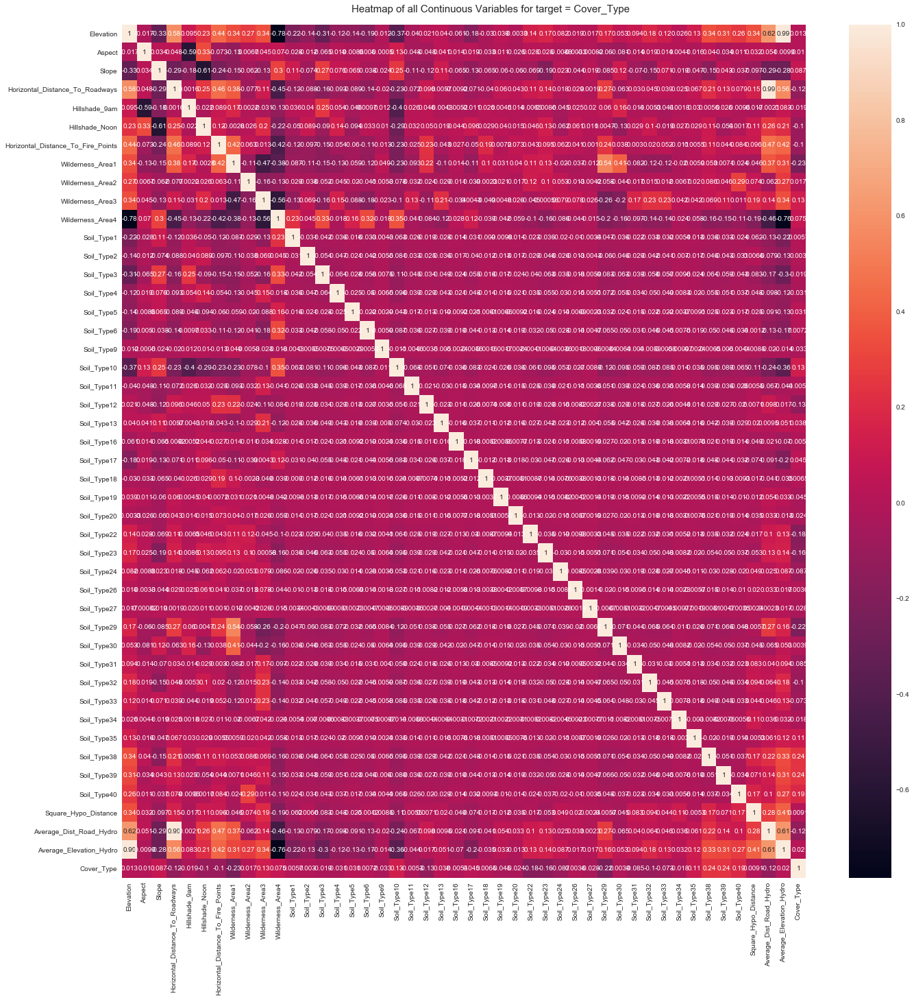

Could not draw Pivot Charts against Dependent Variable
No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz (in seconds) = 83.432

 ###################### VISUALIZATION Completed ########################


ValueError: Image size of 1440x107460 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1440x107460 with 595 Axes>

In [166]:
!pip install autoviz


Shape of your Data Set: (10500, 46)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  10
    Number of Integer-Categorical Columns =  0
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  35
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    45 Predictors classified...
        This does not include the Target column(s)
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification VISUALIZATION Started #####################


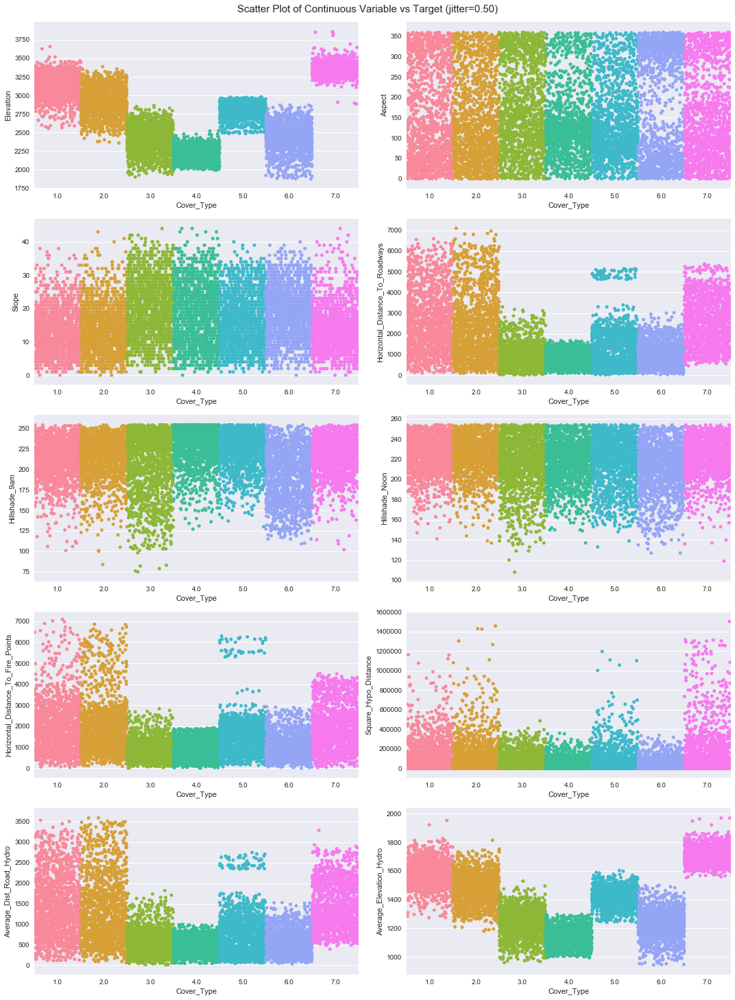

Total Number of Scatter Plots = 55


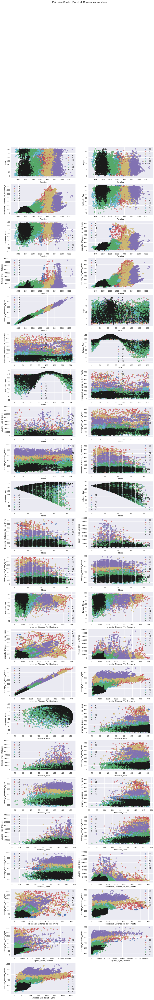

No handles with labels found to put in legend.


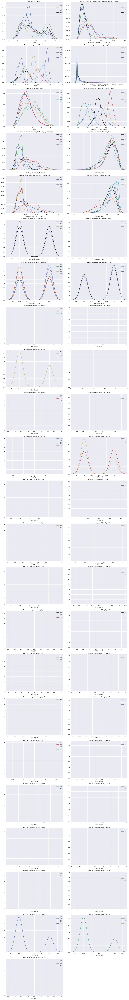

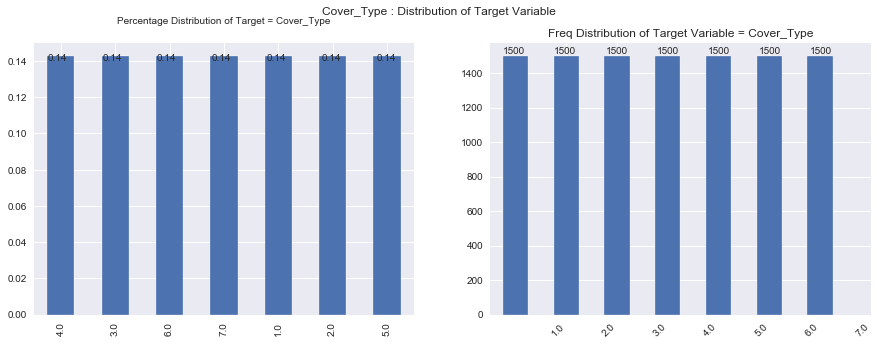

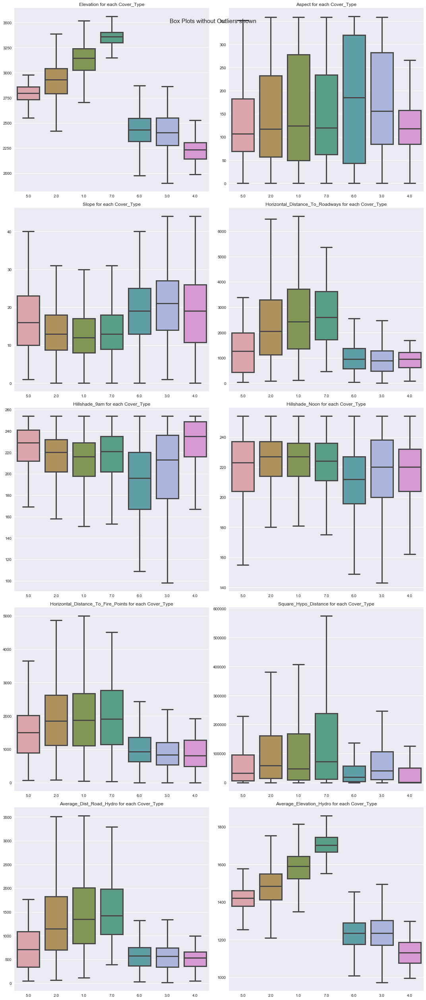

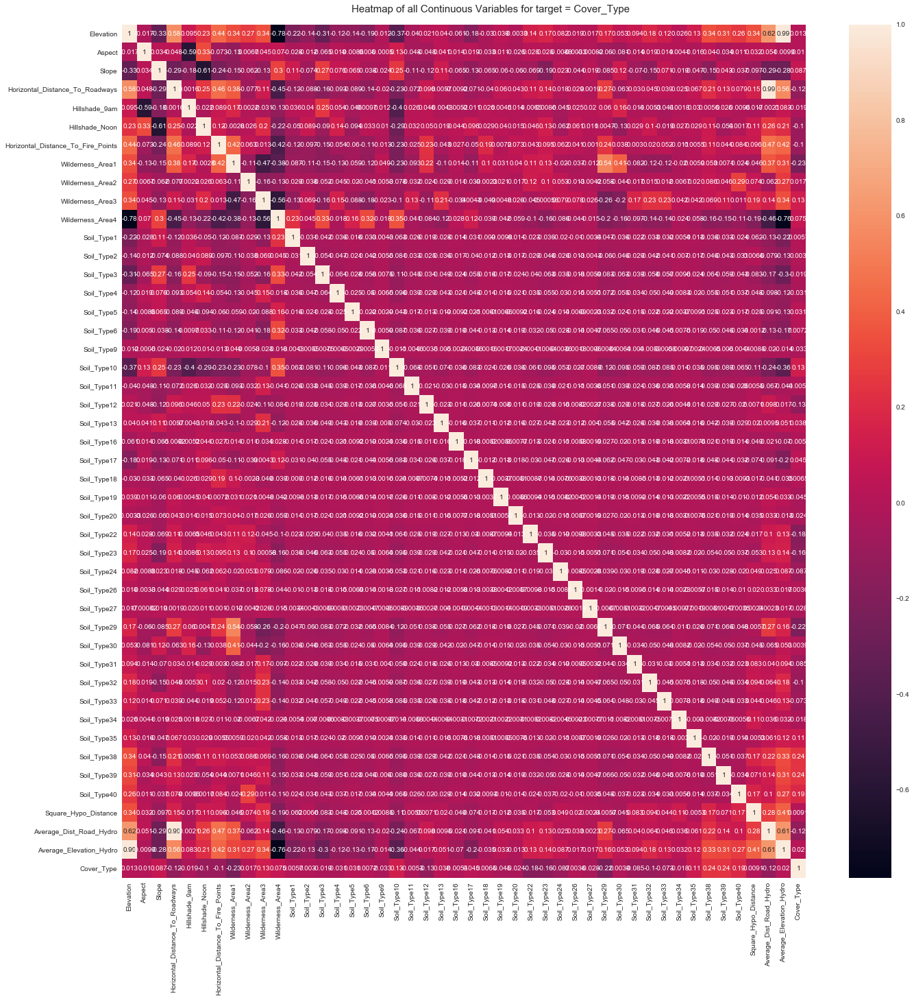

Could not draw Pivot Charts against Dependent Variable
No categorical or numeric vars in data set. Hence no bar charts.
Time to run AutoViz (in seconds) = 83.396

 ###################### VISUALIZATION Completed ########################


ValueError: Image size of 1440x107460 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1440x107460 with 595 Axes>

In [167]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
filename = ""
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="Cover_Type",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=20000,
    max_cols_analyzed=50,
)

## Decision Tree

In [170]:
modelTree = DecisionTreeClassifier()

In [171]:
modelTree.fit(X_train,y_train)

DecisionTreeClassifier()

ax.set_xlim(.70, .85)

In [172]:
y_pred = modelTree.predict(X_test)

In [173]:
confusion_matrix(y_test, y_pred)


array([[186,  85,   2,   0,   9,   3,  33],
       [ 64, 158,   4,   0,  26,  16,   6],
       [  0,   8, 212,  15,  15,  48,   0],
       [  0,   0,  24, 287,   0,  16,   0],
       [  9,  19,   3,   1, 265,   5,   0],
       [  1,   8,  50,  13,   7, 220,   0],
       [ 29,   3,   0,   0,   0,   0, 250]], dtype=int64)

In [174]:
tree_f1 = f1_score(y_test, y_pred, average='macro')
tree_f1

0.7485443650136748

In [175]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         1.0       0.64      0.58      0.61       318
         2.0       0.56      0.58      0.57       274
         3.0       0.72      0.71      0.72       298
         4.0       0.91      0.88      0.89       327
         5.0       0.82      0.88      0.85       302
         6.0       0.71      0.74      0.72       299
         7.0       0.87      0.89      0.88       282

    accuracy                           0.75      2100
   macro avg       0.75      0.75      0.75      2100
weighted avg       0.75      0.75      0.75      2100



ax.set_xlim(.70, .85)

Text(0.5, 1.0, 'F1 Score of Different Models')

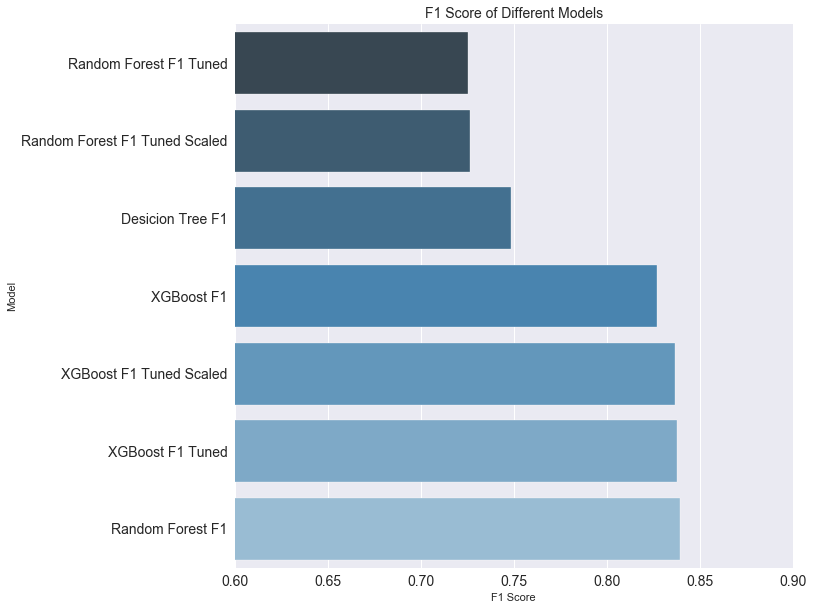

In [176]:
compare = pd.DataFrame({"Model": ["XGBoost F1", "XGBoost F1 Tuned", "XGBoost F1 Tuned Scaled", "Random Forest F1",
                                  "Random Forest F1 Tuned","Random Forest F1 Tuned Scaled","Desicion Tree F1"],
                        "F1 Score": [xgb_f1, xgb_f1_tuned, xgb_f1_tuned_scaled, rf_f1, rf_f1_tuned, rf_f1_tuned_scaled,tree_f1]})
compare = compare.sort_values(by="F1 Score", ascending=True)
plt.figure(figsize=(10,10))
ax = sns.barplot(x="F1 Score", y="Model", data=compare, palette="Blues_d")
ax.set_xlim(.60, .90)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.title("F1 Score of Different Models", size=14)

Modelden elde edilen sonucu kullniyoruz.

In [ ]:

https://treetypesprediction.herokuapp.com/ alın hocam

In [ ]:
###############################################   RECAP Finish  #####################

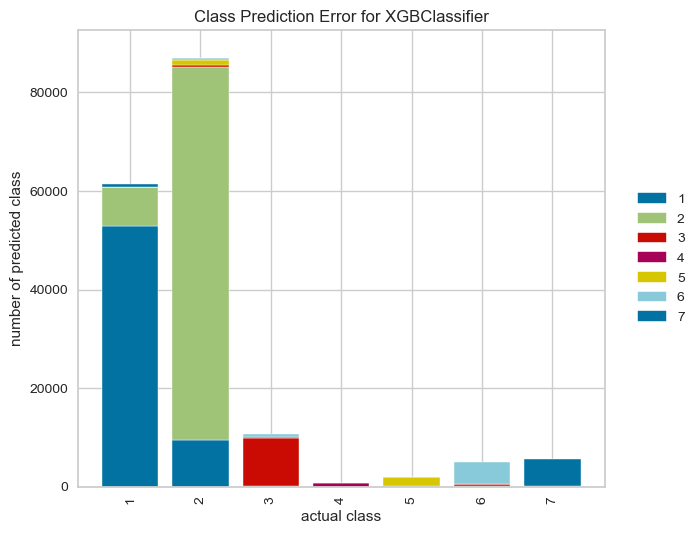

In [50]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(xgb_classifier)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.show()

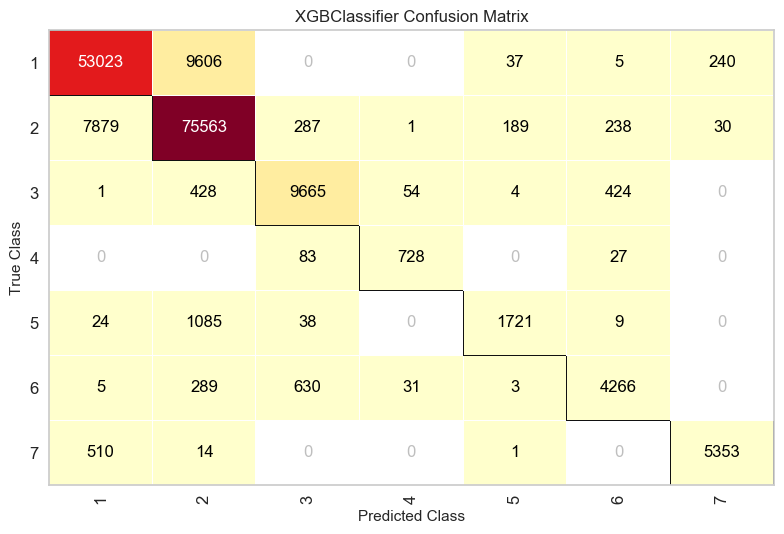

In [51]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split as tts
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import ConfusionMatrix

# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(xgb_classifier)

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)

cm.show()

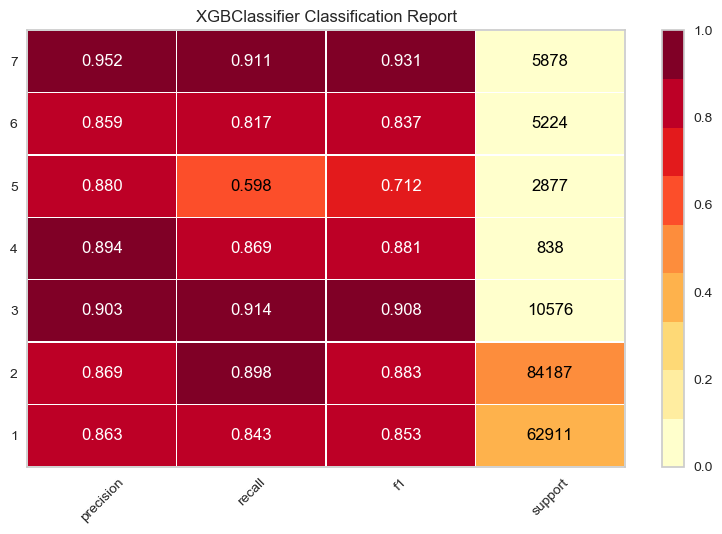

In [52]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.naive_bayes import GaussianNB

from yellowbrick.classifier import ClassificationReport
from yellowbrick.datasets import load_occupancy

visualizer = ClassificationReport(xgb_classifier, support=True)

visualizer.fit(X_train, y_train)        # Fit the visualizer and the model
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

### Implement Support Vector Machine
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

*Note: You probably won't get a successful result. You may need to make some changes to the model or data. This may be a topic worth investigating, you decide.*

In [53]:
#modelSVM = LinearSVC()

In [54]:
#modelSVM.fit(X_train , y_train)

In [55]:
#pred = modelSVM.predict(X_test)

In [56]:
#SVM_accuracy = accuracy_score(pred, y_test)
#SVM_accuracy

In [57]:
'''
df['Square_Hypo_Distance'] = np.sqrt(df['Square_Hypo_Distance'])
df1 = df.drop(['Average_Dist_Road_Hydro','Average_Elevation_Hydro'], axis = 1)
X1 = df1.drop("Cover_Type", axis = 1)
y1 = df1["Cover_Type"]

'''

'\ndf[\'Square_Hypo_Distance\'] = np.sqrt(df[\'Square_Hypo_Distance\'])\ndf1 = df.drop([\'Average_Dist_Road_Hydro\',\'Average_Elevation_Hydro\'], axis = 1)\nX1 = df1.drop("Cover_Type", axis = 1)\ny1 = df1["Cover_Type"]\n\n'

In [58]:
#X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=101)

In [59]:
#modelSVM1 = LinearSVC()

In [60]:
#modelSVM1.fit(X1_train , y1_train)

In [61]:
#pred1 = modelSVM1.predict(X1_test)

In [62]:
#SVM_accuracy1 = accuracy_score(pred1, y1_test)

In [63]:
#SVM_accuracy1

- I've doubled the **accuracy score** but it's still insufficient. SVM Classifier ;
   - SVM has been widely used in finance. For example, predicting stock price via SVM has been a acknowledged application in the industry.
   - In classification of text and handwritten objects, SVM performs well.
   - It may not be very successful in datasets with more than 100,000 data.

In [64]:
'''
visualizer = ClassPredictionError(modelSVM1)

# Fit the training data to the visualizer
visualizer.fit(X1_train, y1_train)

# Evaluate the model on the test data
visualizer.score(X1_test, y1_test)

# Draw visualization
visualizer.show()

'''

'\nvisualizer = ClassPredictionError(modelSVM1)\n\n# Fit the training data to the visualizer\nvisualizer.fit(X1_train, y1_train)\n\n# Evaluate the model on the test data\nvisualizer.score(X1_test, y1_test)\n\n# Draw visualization\nvisualizer.show()\n\n'

In [65]:
'''
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(modelSVM1)

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X1_train, y1_train)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X1_test, y1_test)

cm.show()

'''

'\n# The ConfusionMatrix visualizer taxes a model\ncm = ConfusionMatrix(modelSVM1)\n\n# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model\ncm.fit(X1_train, y1_train)\n\n# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data\n# and then creates the confusion_matrix from scikit-learn.\ncm.score(X1_test, y1_test)\n\ncm.show()\n\n'

In [66]:
'''
visualizer = ClassificationReport(modelSVM1, support=True)

visualizer.fit(X1_train, y1_train)        # Fit the visualizer and the model
visualizer.score(X1_test, y1_test)        # Evaluate the model on the test data
visualizer.show() 

'''

'\nvisualizer = ClassificationReport(modelSVM1, support=True)\n\nvisualizer.fit(X1_train, y1_train)        # Fit the visualizer and the model\nvisualizer.score(X1_test, y1_test)        # Evaluate the model on the test data\nvisualizer.show() \n\n'

- We can see from the plots that more than half of the classes are predicted correctly. But the model predicted 5 classes although there are 7. Class 5 and 7 could not detected.

### Implement Decision Tree Classifier
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

In [67]:
modelTree = DecisionTreeClassifier()

In [68]:
modelTree.fit(X_train , y_train)

DecisionTreeClassifier()

In [94]:
pred = modelTree.predict(X_test)

In [95]:
tree_f1 = f1_score(y_test, pred, average='macro')
tree_f1

0.8950057487680628

In [70]:
tree_accuracy = accuracy_score(pred, y_test)

In [71]:
tree_accuracy

0.9355444631893838

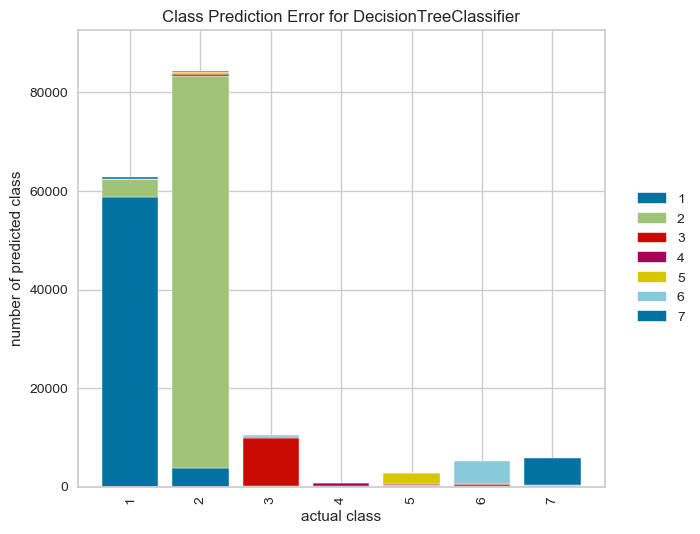

In [72]:
visualizer = ClassPredictionError(modelTree)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.show()

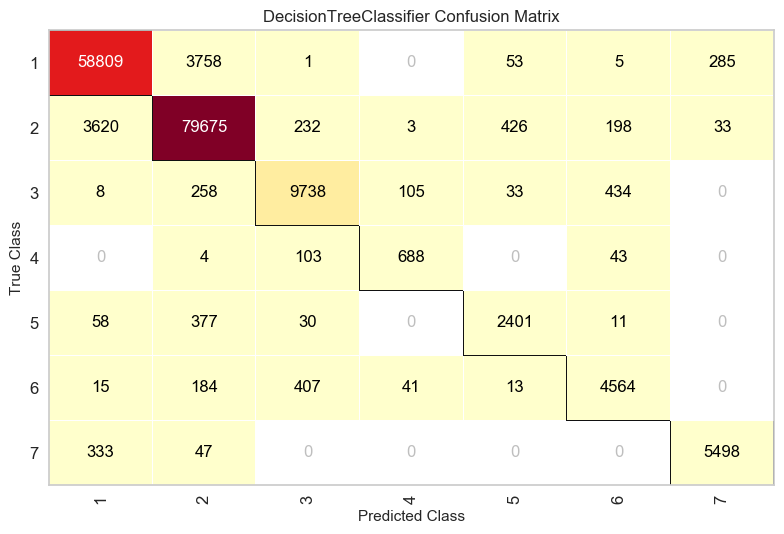

In [73]:
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(modelTree)

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)

cm.show()

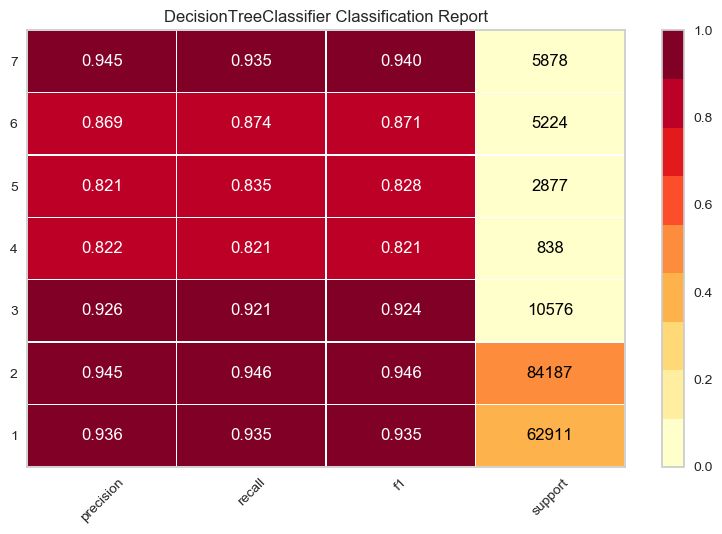

In [74]:
visualizer = ClassificationReport(modelTree, support=True)

visualizer.fit(X_train, y_train)        # Fit the visualizer and the model
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

### Implement KNeighborsClassifer

The first and most important step for the [KNN](https://www.analyticsvidhya.com/blog/2018/03/introduction-k-neighbours-algorithm-clustering/) algorithm is to determine the optimal k (number of neighbors). 

Build different models with k values in the range you specify. You can observe the change of train and test accuracy values according to different k values using a plot. The point at which train accuracy and test accuracy values begin to run parallel is the optimal k value. Then set up your final KNN model with the optimal k value you determined and calculate accuracy.

- Import the modul
- Fit the model 
- Predict the test set
- Visualize the result
- Evaluate the performance

In [75]:
neighbors = np.arange(1, 7)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    #Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors = k)
    
    #Fit the model
    knn.fit(X_train, y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train, y_train)
    
    #Compute accuracy on the test set
    test_accuracy[i] = knn.score(X_test, y_test)

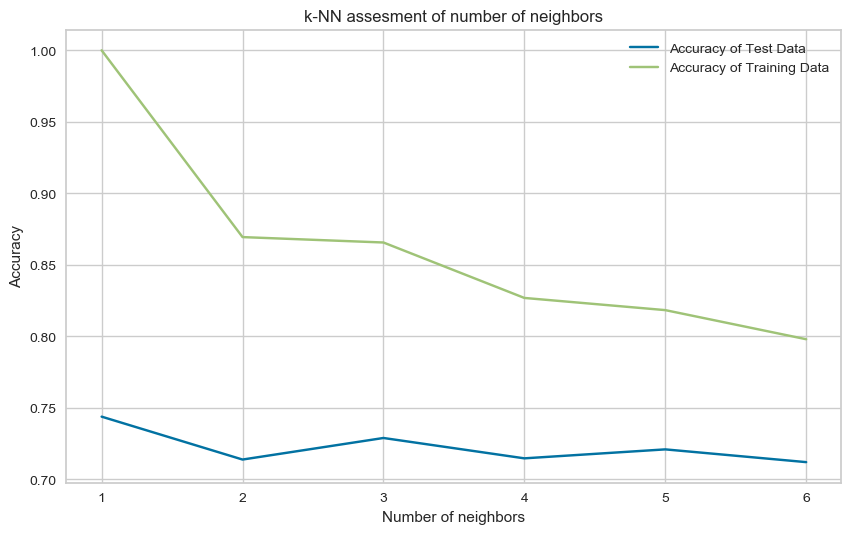

In [77]:
plt.figure(figsize=(10,6))
plt.title('k-NN assesment of number of neighbors')
plt.plot(neighbors, test_accuracy, label='Accuracy of Test Data')
plt.plot(neighbors, train_accuracy, label='Accuracy of Training Data')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [78]:
knn5 = KNeighborsClassifier(n_neighbors = 5)

In [79]:
knn5.fit(X_train,y_train)

KNeighborsClassifier()

In [103]:
y_pred = knn5.predict(X_test)

In [104]:
knn5_f1 = f1_score(y_test, y_pred, average='macro')
knn5_f1

0.5703464819893874

In [105]:
knn_accuracy = knn5.score(X_test,y_test)

In [106]:
knn_accuracy

0.7210115310364019

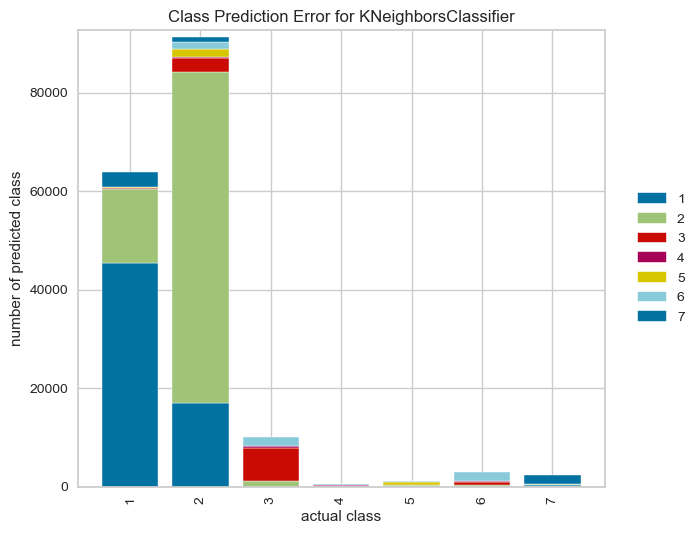

In [82]:
visualizer = ClassPredictionError(knn5)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.show()

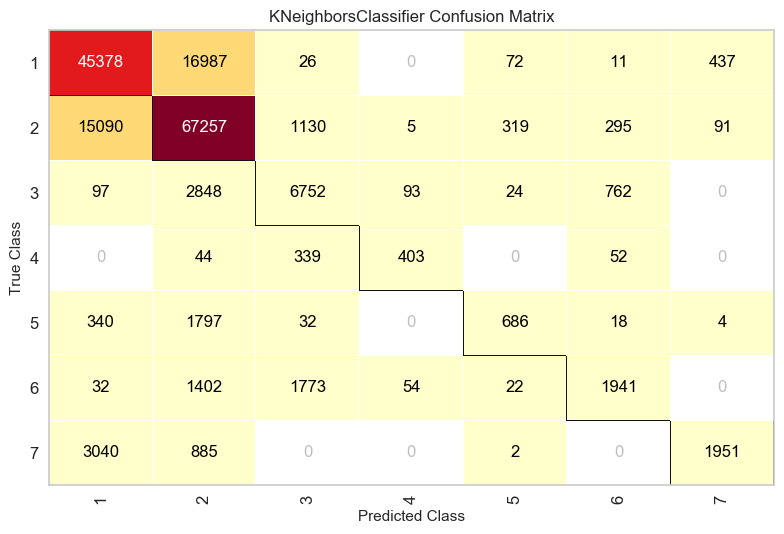

In [83]:
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(knn5)

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)

cm.show()

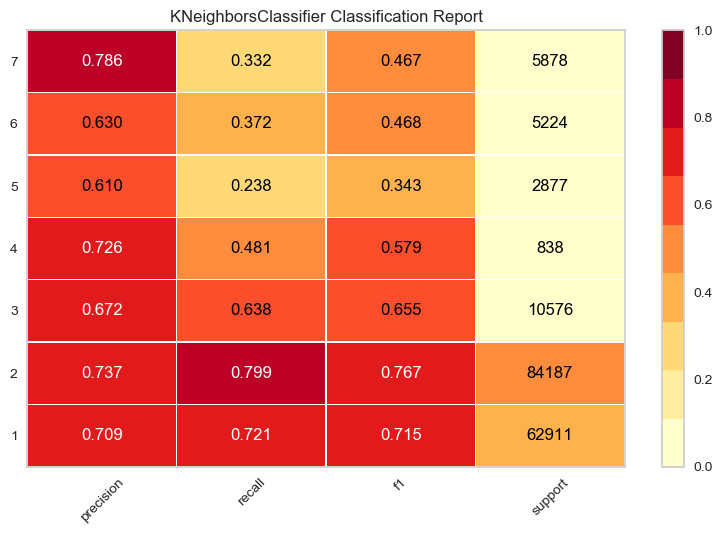

In [84]:
visualizer = ClassificationReport(knn5, support=True)

visualizer.fit(X_train, y_train)        # Fit the visualizer and the model
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

### Implement Random Forest Classifier
- Import the modul 
- Fit the model 
- Predict the test set
- Visualize and evaluate the result (use yellowbrick module)

In [85]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [86]:
rfc_pred = rfc.predict(X_test)

In [107]:
rfc_f1 = f1_score(y_test, rfc_pred, average='macro')
rfc_f1

0.9356946601929562

In [108]:
rf_accuracy = rfc.score(X_test,y_test)

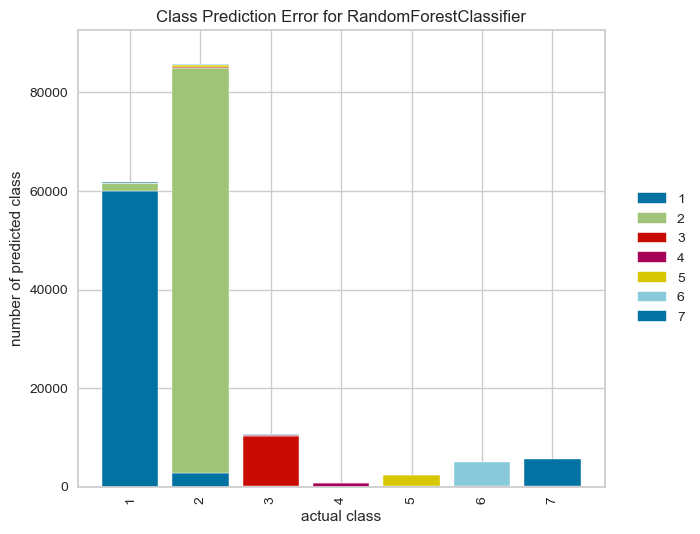

In [88]:
visualizer = ClassPredictionError(rfc)

# Fit the training data to the visualizer
visualizer.fit(X_train, y_train)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.show()

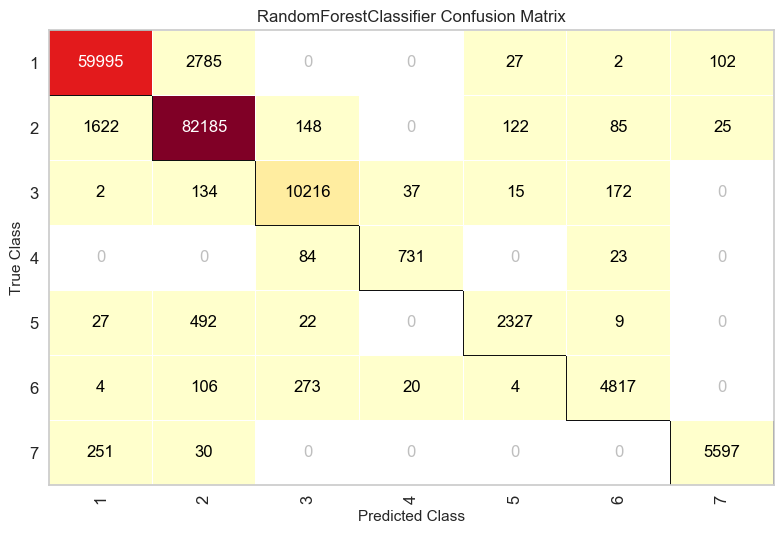

In [89]:
# The ConfusionMatrix visualizer taxes a model
cm = ConfusionMatrix(rfc)

# Fit fits the passed model. This is unnecessary if you pass the visualizer a pre-fitted model
cm.fit(X_train, y_train)

# To create the ConfusionMatrix, we need some test data. Score runs predict() on the data
# and then creates the confusion_matrix from scikit-learn.
cm.score(X_test, y_test)

cm.show()

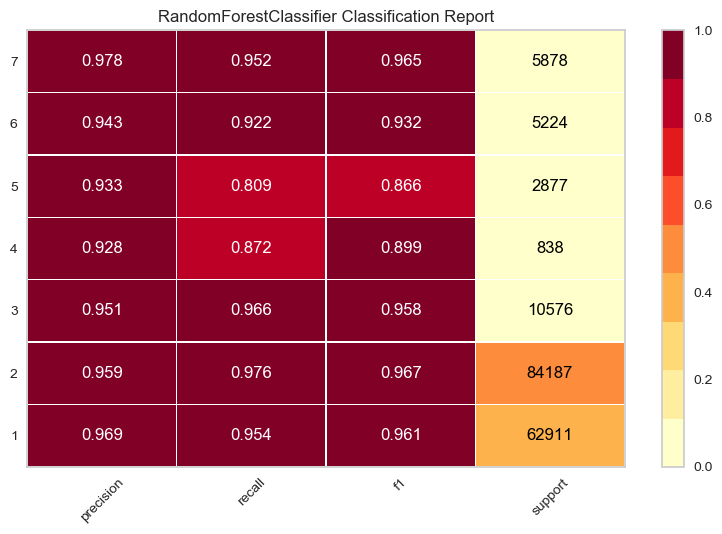

In [90]:
visualizer = ClassificationReport(rfc, support=True)

visualizer.fit(X_train, y_train)        # Fit the visualizer and the model
visualizer.score(X_test, y_test)        # Evaluate the model on the test data
visualizer.show() 

### Compare The Models

So far, you have created a multi-classifier model with 5 different algorithms and made predictions. You can observe the performance of the models together with a barplot of your choice.

- Which algorithm did you achieve the highest prediction performance with? 
- What could be the factors that cause this? What are the principles of the most successful algorithm and its differences from other algorithms? 

In contrast;

- Which algorithm did you achieve the lowest prediction performance with? 
- What could be the factors that cause this? What are the principles of the most successful algorithm and its differences from other algorithms? 

The answers you will look for to these questions will increase your gains from Machine Learning course.

# Accuracy Comparison

Text(0.5, 1.0, 'Accuracy Score of Different Models')

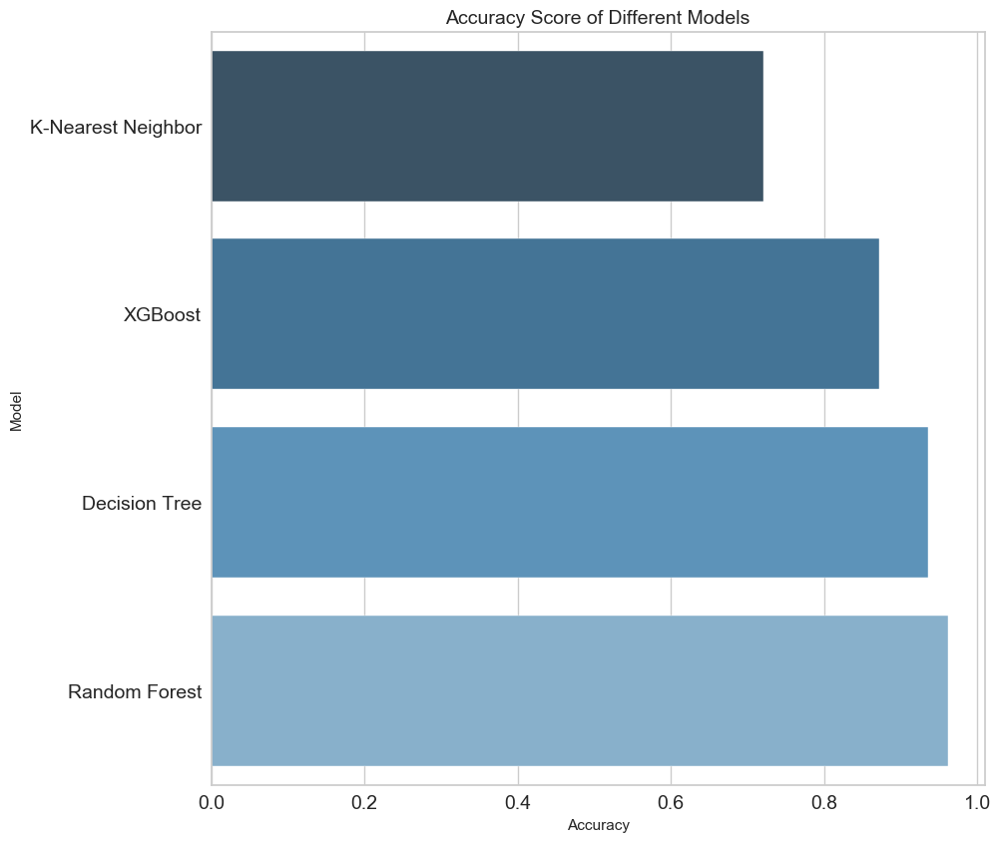

In [110]:
compare = pd.DataFrame({"Model": ["K-Nearest Neighbor", "Random Forest", "XGBoost", "Decision Tree"],
                        "Accuracy": [knn_accuracy, rf_accuracy, xgb_accuracy, tree_accuracy]})

compare = compare.sort_values(by="Accuracy", ascending=True)

plt.figure(figsize=(10,10))
ax = sns.barplot(x="Accuracy", y="Model", data=compare, palette="Blues_d")

plt.yticks(size = 14)
plt.xticks(size = 14)
plt.title("Accuracy Score of Different Models", size=14)

# F1 Score Comparison

Text(0.5, 1.0, 'Accuracy Score of Different Models')

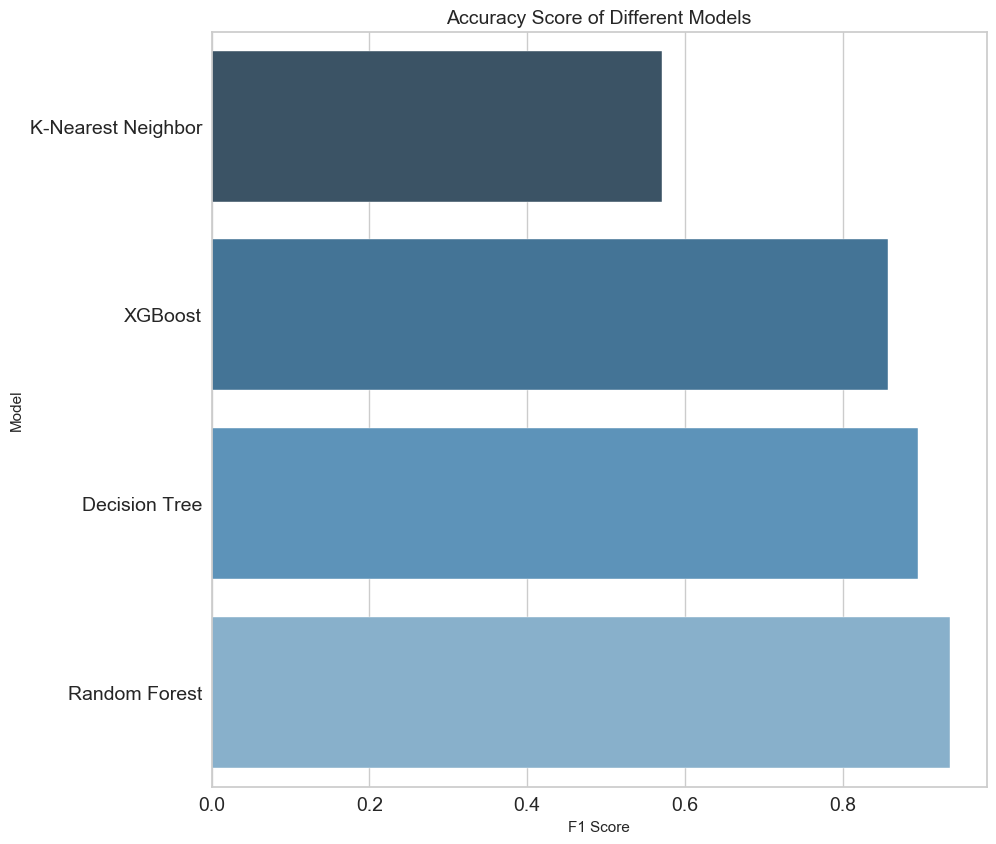

In [113]:
compare = pd.DataFrame({"Model": ["K-Nearest Neighbor", "Random Forest", "XGBoost", "Decision Tree"],
                        "F1 Score": [knn5_f1, rfc_f1, xgb_f1, tree_f1]})

compare = compare.sort_values(by="F1 Score", ascending=True)

plt.figure(figsize=(10,10))
ax = sns.barplot(x="F1 Score", y="Model", data=compare, palette="Blues_d")

plt.yticks(size = 14)
plt.xticks(size = 14)
plt.title("Accuracy Score of Different Models", size=14)

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___